In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
# Loading dataset
sm_df = pd.read_csv('data/CC_LCL-FullData.csv')
sm_df.head()

,LCLid,stdorToU,DateTime,KWH/hh (per half hour)
0,MAC000002,Std,2012-10-12 00:30:00.0000000,0
1,MAC000002,Std,2012-10-12 01:00:00.0000000,0
2,MAC000002,Std,2012-10-12 01:30:00.0000000,0
3,MAC000002,Std,2012-10-12 02:00:00.0000000,0
4,MAC000002,Std,2012-10-12 02:30:00.0000000,0


In [3]:
# Renaming columns for easier access
sm_df.columns = ['lclid', 'tariff_type', 'datetime', 'kwh']

# Converting datetime
sm_df['datetime'] = pd.to_datetime(sm_df['datetime'])

# Removing households with time-of-use tariffs to keep only standard tariff households
sm_df = sm_df[sm_df['tariff_type'] == 'Std']

# Resetting index
sm_df = sm_df.reset_index(drop=True)

# Summary
sm_df.info()

sm_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134148703 entries, 0 to 134148702
Data columns (total 4 columns):
 #   Column       Dtype         
---  ------       -----         
 0   lclid        object        
 1   tariff_type  object        
 2   datetime     datetime64[ns]
 3   kwh          object        
dtypes: datetime64[ns](1), object(3)
memory usage: 4.0+ GB


,lclid,tariff_type,datetime,kwh
0,MAC000002,Std,2012-10-12 00:30:00,0
1,MAC000002,Std,2012-10-12 01:00:00,0
2,MAC000002,Std,2012-10-12 01:30:00,0
3,MAC000002,Std,2012-10-12 02:00:00,0
4,MAC000002,Std,2012-10-12 02:30:00,0


In [4]:
# Number of unique households in the dataset
sm_df['lclid'].nunique()

4443

In [5]:
# The distribution of how many records each household has 
sm_df['lclid'].value_counts().describe()

count     4443.000000
mean     30193.270988
std       5451.352488
min          1.000000
25%      28700.000000
50%      31118.000000
75%      32827.000000
max      39752.000000
Name: count, dtype: float64

In [6]:
# Time frame of the dataset
sm_df['datetime'].min(), sm_df['datetime'].max()

(Timestamp('2011-11-23 09:00:00'), Timestamp('2014-02-28 00:00:00'))

In [7]:
# Checking data type of 'kwh' column
sm_df['kwh'].dtype

dtype('O')

In [8]:
# Converting object to float
sm_df['kwh'] = pd.to_numeric(sm_df['kwh'], errors='coerce')


In [9]:
# Ensuring 'kwh' has correct data type
sm_df['kwh'].dtype

dtype('float64')

## Opening weather dataset to find the coldest day during the period of smart meters data availability

In [10]:
# Loading the file
w_df = pd.read_csv('Sources/03770099999.csv')
w_df.head()

,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,TEMP,TEMP_ATTRIBUTES,DEWP,DEWP_ATTRIBUTES,...,MXSPD,GUST,MAX,MAX_ATTRIBUTES,MIN,MIN_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNDP,FRSHTT
0,3770099999,2012-01-01,51.5,-0.116667,5.0,"ST JAMES PARK, UK",54.3,14,50.8,14,...,999.9,999.9,55.4,*,53.1,*,0.03,G,999.9,0
1,3770099999,2012-01-02,51.5,-0.116667,5.0,"ST JAMES PARK, UK",43.8,15,38.1,15,...,999.9,999.9,46.2,*,41.2,*,0.42,G,999.9,0
2,3770099999,2012-01-03,51.5,-0.116667,5.0,"ST JAMES PARK, UK",48.7,18,42.6,18,...,999.9,999.9,54.7,,42.1,,0.05,G,999.9,0
3,3770099999,2012-01-04,51.5,-0.116667,5.0,"ST JAMES PARK, UK",45.0,24,38.4,24,...,999.9,999.9,49.3,*,41.4,,0.27,G,999.9,0
4,3770099999,2012-01-05,51.5,-0.116667,5.0,"ST JAMES PARK, UK",49.9,24,39.8,24,...,999.9,999.9,53.4,,45.5,*,0.15,G,999.9,0


In [11]:
# Converting Fahrenheit into Celcius and finding max and min temperature in the column with minimal temperature per day
w_df['min_c'] = ((w_df['MIN'] - 32) * 5 / 9).round(2)
w_df.head()
print(w_df['min_c'].min())
print(w_df['min_c'].max())

-3.89
20.78


In [12]:
# Finding 5 most cold days to find week and weekend days
coldest_days = w_df.nsmallest(5, 'min_c')  # Get 5 rows with the lowest min_c
coldest_days.head()

,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,TEMP,TEMP_ATTRIBUTES,DEWP,DEWP_ATTRIBUTES,...,GUST,MAX,MAX_ATTRIBUTES,MIN,MIN_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNDP,FRSHTT,min_c
41,3770099999,2012-02-11,51.5,-0.116667,5.0,"ST JAMES PARK, UK",30.2,24,23.0,24,...,999.9,37.4,,25.0,*,0.08,G,999.9,0,-3.89
346,3770099999,2012-12-12,51.5,-0.116667,5.0,"ST JAMES PARK, UK",31.3,24,28.7,24,...,999.9,36.9,,25.5,*,0.00,G,999.9,0,-3.61
42,3770099999,2012-02-12,51.5,-0.116667,5.0,"ST JAMES PARK, UK",34.3,24,30.7,24,...,999.9,42.1,,26.2,,0.01,G,999.9,0,-3.22
340,3770099999,2012-12-06,51.5,-0.116667,5.0,"ST JAMES PARK, UK",34.8,24,30.0,24,...,999.9,41.0,*,27.0,*,0.03,G,999.9,0,-2.78
34,3770099999,2012-02-04,51.5,-0.116667,5.0,"ST JAMES PARK, UK",30.9,24,25.0,24,...,999.9,34.9,,27.5,,0.00,G,999.9,0,-2.50


In [13]:
# Two most cold days
print(coldest_days[['DATE', 'min_c']].head(2))

           DATE  min_c
41   2012-02-11  -3.89
346  2012-12-12  -3.61


# Back to smart meters dataset analysys

## 12th of December 2012 - week day

In [14]:
# Filtering for only 12th of December 2012
target_week_day = pd.Timestamp('2012-12-12')
df_dec12 = sm_df[sm_df['datetime'].dt.date == target_week_day.date()].copy()
df_dec12.head()

,lclid,tariff_type,datetime,kwh
2878,MAC000002,Std,2012-12-12 00:00:00,0.250
2879,MAC000002,Std,2012-12-12 00:30:00,0.239
2880,MAC000002,Std,2012-12-12 01:00:00,0.263
2881,MAC000002,Std,2012-12-12 01:30:00,0.161
2882,MAC000002,Std,2012-12-12 02:00:00,0.125


In [15]:
# Number of unique households in the 12 Dec dataset
df_dec12['lclid'].nunique()

4411

In [16]:
# Calculating total consumption per household on 12 Dec 2012
daily_totals_dec12 = df_dec12.groupby('lclid')['kwh'].sum().reset_index()
daily_totals_dec12.columns = ['household', 'total_kwh']
daily_totals_dec12.head()

,household,total_kwh
0,MAC000002,11.971
1,MAC000003,42.112
2,MAC000004,1.846
3,MAC000006,0.509
4,MAC000007,6.683


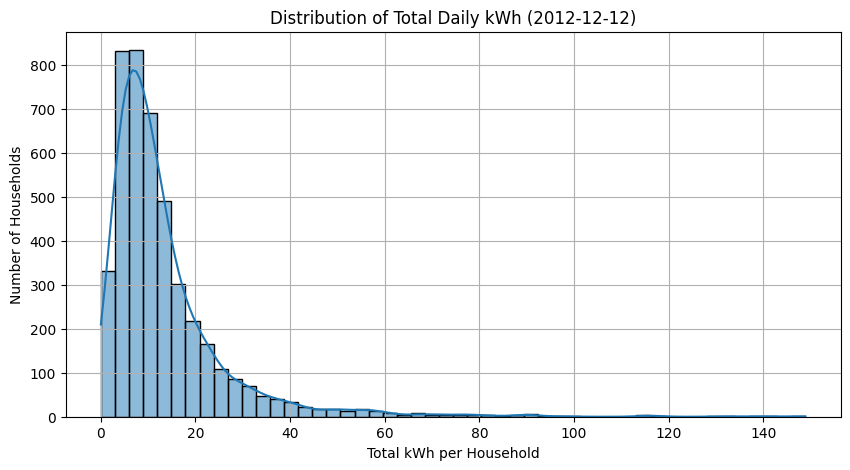

In [17]:
# Visualising distribution of consumption
plt.figure(figsize=(10, 5))
sns.histplot(daily_totals_dec12['total_kwh'], bins=50, kde=True)
plt.title('Distribution of Total Daily kWh (2012-12-12)')
plt.xlabel('Total kWh per Household')
plt.ylabel('Number of Households')
plt.grid(True)
plt.show()


In [18]:
# Filtering houses with consumption between 5 and 10 kwh a day.
# 12th of December
target_ids_dec12 = daily_totals_dec12[
    (daily_totals_dec12['total_kwh'] >= 5) & (daily_totals_dec12['total_kwh'] <= 10)
]['household']

df_dec12_5to10 = df_dec12[df_dec12['lclid'].isin(target_ids_dec12)].copy()
df_dec12_5to10.head()

,lclid,tariff_type,datetime,kwh
131535,MAC000007,Std,2012-12-12 00:00:00,0.045
131536,MAC000007,Std,2012-12-12 00:30:00,0.060
131537,MAC000007,Std,2012-12-12 01:00:00,0.065
131538,MAC000007,Std,2012-12-12 01:30:00,0.073
131539,MAC000007,Std,2012-12-12 02:00:00,0.096


In [19]:
target_ids_dec12.head()

4     MAC000007
10    MAC000013
13    MAC000019
14    MAC000020
19    MAC000025
Name: household, dtype: object

In [20]:
# Counting the number of households between 5 and 10 kwh a day.
# Dec 12
df_dec12_5to10['lclid'].nunique()

1396

In [21]:
# Counting the number of households between 5 and 10 kwh a day.
# Dec 12
target_ids_dec12 = daily_totals_dec12[
    (daily_totals_dec12['total_kwh'] >= 5) & (daily_totals_dec12['total_kwh'] <= 10)
]

print("Number of households in 5–10 kWh range on dec12:", len(target_ids_dec12))


Number of households in 5–10 kWh range on dec12: 1396


In [22]:
daily_totals_dec12.head()

,household,total_kwh
0,MAC000002,11.971
1,MAC000003,42.112
2,MAC000004,1.846
3,MAC000006,0.509
4,MAC000007,6.683


Filtered rows: 66884
Households matched: 1396


/var/folders/pz/n2fzt2pd1dd376dvy33xfysc0000gn/T/ipykernel_32379/3441566576.py:27: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


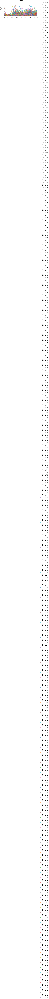

In [23]:
# 1) Normalizing both tables
df_dec12 = df_dec12.copy()
df_dec12['lclid_norm'] = df_dec12['lclid'].astype(str).str.strip().str.upper()

targets = target_ids_dec12.copy()
targets['lclid_norm'] = targets['household'].astype(str).str.strip().str.upper()

# 2) Inner join to keep only selected households
df_filtered_dec12 = df_dec12.merge(
    targets[['lclid_norm', 'total_kwh']],
    on='lclid_norm',
    how='inner'
)

print("Filtered rows:", len(df_filtered_dec12))
print("Households matched:", df_filtered_dec12['lclid_norm'].nunique())

# Plot with daily total in legend
import matplotlib.pyplot as plt
plt.figure(figsize=(14,6))
for hid, g in df_filtered_dec12.groupby('lclid_norm'):
    tot = g['total_kwh'].iloc[0]
    plt.plot(pd.to_datetime(g['datetime']), g['kwh'], label=f"{hid} (day={tot:.1f} kWh)", alpha=0.6)
plt.xlabel("Time of day"); plt.ylabel("kWh per 30 min")
plt.title("Selected households")
plt.legend(bbox_to_anchor=(1.02,1), loc="upper left")
plt.tight_layout()
plt.show()


# Changing time resolution from 30 min to 1 min

In [24]:
# Converting from kwh per 30 min to kw
# 12Dec
df_filtered_dec12['kw'] = df_filtered_dec12['kwh'] * 2
df_filtered_dec12.head()

,lclid,tariff_type,datetime,kwh,lclid_norm,total_kwh,kw
0,MAC000007,Std,2012-12-12 00:00:00,0.045,MAC000007,6.683,0.090
1,MAC000007,Std,2012-12-12 00:30:00,0.060,MAC000007,6.683,0.120
2,MAC000007,Std,2012-12-12 01:00:00,0.065,MAC000007,6.683,0.130
3,MAC000007,Std,2012-12-12 01:30:00,0.073,MAC000007,6.683,0.146
4,MAC000007,Std,2012-12-12 02:00:00,0.096,MAC000007,6.683,0.192


In [25]:
df_filtered_dec12.tail()

,lclid,tariff_type,datetime,kwh,lclid_norm,total_kwh,kw
66879,MAC005566,Std,2012-12-12 21:30:00,0.135,MAC005566,5.125,0.270
66880,MAC005566,Std,2012-12-12 22:00:00,0.103,MAC005566,5.125,0.206
66881,MAC005566,Std,2012-12-12 22:30:00,0.108,MAC005566,5.125,0.216
66882,MAC005566,Std,2012-12-12 23:00:00,0.088,MAC005566,5.125,0.176
66883,MAC005566,Std,2012-12-12 23:30:00,0.084,MAC005566,5.125,0.168


In [26]:
df_filtered_dec12['kwh'].sum()

10294.5940011

In [27]:
# Interpolating 30-minutes resolution to 1-minutes resolution of power
# Dec12

# Cleaning column names
df_filtered_dec12.columns = df_filtered_dec12.columns.str.strip().str.lower()

# Ensuring datetime column is present and parsed
if df_filtered_dec12.index.name == 'datetime':
    df_filtered_dec12.reset_index(inplace=True)

df_filtered_dec12['datetime'] = pd.to_datetime(df_filtered_dec12['datetime'], errors='coerce')
df_filtered_dec12 = df_filtered_dec12.dropna(subset=['datetime'])

# Ensuring numeric conversion and calculating average power (kW)
df_filtered_dec12['kwh'] = pd.to_numeric(df_filtered_dec12['kwh'], errors='coerce')
df_filtered_dec12['kw'] = df_filtered_dec12['kwh'] * 2  # since 30 minutes = 0.5h

# Defining per-household processing function

def process_household(lclid, df_house_dec12):
    # clean & sort
    s = (df_house_dec12
         .set_index('datetime')
         .sort_index())
    s = s[~s.index.duplicated(keep='first')]

    # 30-min energy and average power (kW)
    s['kwh_30m'] = pd.to_numeric(s['kwh'], errors='coerce')
    s['kw'] = s['kwh_30m'] * 2.0  # kWh / 0.5 h

    pieces = []
    # do it day-by-day so we always end at 23:59
    for day, g in s.groupby(pd.Grouper(freq='D')):
        if g.empty:
            continue
        day_start = day.normalize()
        day_end   = day_start + pd.Timedelta(days=1) - pd.Timedelta(minutes=1)
        full_idx  = pd.date_range(day_start, day_end, freq='1min')

        # reindex to full day and fill inside the day
        out = (g[['kwh_30m','kw']]
               .reindex(full_idx)
               .ffill()
               .bfill())

        out['kwh_min'] = out['kw'] / 60.0
        out['lclid'] = lclid
        out['time'] = out.index.time
        pieces.append(out)

    out = pd.concat(pieces).sort_index()
    out.index.name = "datetime"
    return out




# Applying to all households
df_out_dec12 = (
    df_filtered_dec12
    .groupby('lclid', group_keys=False)
    .apply(lambda df_group_dec12: process_household(df_group_dec12['lclid'].iloc[0], df_group_dec12))
)

# Restoring datetime as a column
df_out_dec12.reset_index(inplace=True)

# Saving to CSV
df_out_dec12.to_csv("resampled_all_households_5min.csv", index=False)

df_out_dec12.head(30)

/var/folders/pz/n2fzt2pd1dd376dvy33xfysc0000gn/T/ipykernel_32379/1858432625.py:64: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df_group_dec12: process_household(df_group_dec12['lclid'].iloc[0], df_group_dec12))


,datetime,kwh_30m,kw,kwh_min,lclid,time
0,2012-12-12 00:00:00,0.045,0.09,0.0015,MAC000007,00:00:00
1,2012-12-12 00:01:00,0.045,0.09,0.0015,MAC000007,00:01:00
2,2012-12-12 00:02:00,0.045,0.09,0.0015,MAC000007,00:02:00
3,2012-12-12 00:03:00,0.045,0.09,0.0015,MAC000007,00:03:00
4,2012-12-12 00:04:00,0.045,0.09,0.0015,MAC000007,00:04:00
5,2012-12-12 00:05:00,0.045,0.09,0.0015,MAC000007,00:05:00
6,2012-12-12 00:06:00,0.045,0.09,0.0015,MAC000007,00:06:00
7,2012-12-12 00:07:00,0.045,0.09,0.0015,MAC000007,00:07:00
8,2012-12-12 00:08:00,0.045,0.09,0.0015,MAC000007,00:08:00
9,2012-12-12 00:09:00,0.045,0.09,0.0015,MAC000007,00:09:00


In [28]:
df_out_dec12.tail(5)

,datetime,kwh_30m,kw,kwh_min,lclid,time
2010235,2012-12-12 23:55:00,0.084,0.168,0.0028,MAC005566,23:55:00
2010236,2012-12-12 23:56:00,0.084,0.168,0.0028,MAC005566,23:56:00
2010237,2012-12-12 23:57:00,0.084,0.168,0.0028,MAC005566,23:57:00
2010238,2012-12-12 23:58:00,0.084,0.168,0.0028,MAC005566,23:58:00
2010239,2012-12-12 23:59:00,0.084,0.168,0.0028,MAC005566,23:59:00


In [29]:
g = df_out_dec12[df_out_dec12['lclid']=='MAC000007'].set_index('datetime')
# Step behaviour (no ramps within 30-min blocks)
print("Max minute-to-minute change within 30 min:",
      g['kw'].groupby(pd.Grouper(freq='30min')).apply(lambda s: s.diff().abs().max()).max())
# Daily energy preserved
kwh_30_sum = df_filtered_dec12[df_filtered_dec12['lclid']=='MAC000007'].groupby(pd.Grouper(key='datetime', freq='D'))['kwh'].sum()
kwh_1min_sum = (g['kw']/60).groupby(pd.Grouper(freq='D')).sum()
print(pd.concat([kwh_30_sum.rename('kWh_30m'), kwh_1min_sum.rename('kWh_1m')], axis=1))


Max minute-to-minute change within 30 min: 0.0
            kWh_30m  kWh_1m
datetime                   
2012-12-12    6.683   6.683


In [30]:
df_out_dec12['kwh_min'].sum()

10311.447001100001

In [31]:
df_out_dec12['lclid'].nunique()

1396

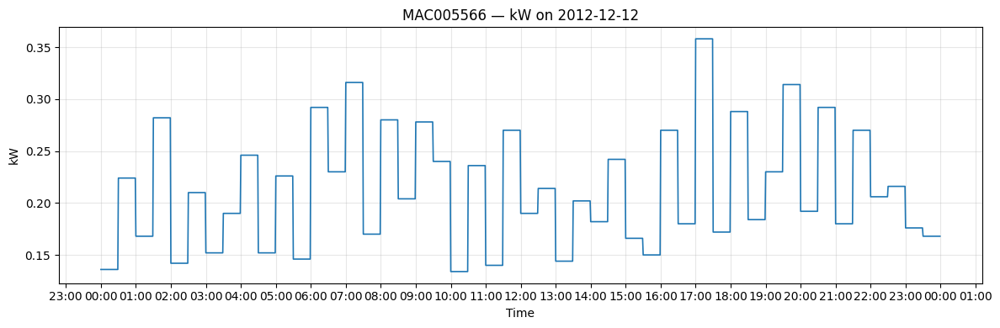

In [32]:
# Plot kW for one household
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

df = df_out_dec12.copy()
df['datetime'] = pd.to_datetime(df['datetime'])

hid = "MAC005566"  # house number
g = df[df['lclid'] == hid].sort_values('datetime')

fig, ax = plt.subplots(figsize=(12,4))
ax.plot(g['datetime'], g['kw'], lw=1.2)
ax.set(title=f"{hid} — kW on 2012-12-12", xlabel="Time", ylabel="kW")
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()



/var/folders/pz/n2fzt2pd1dd376dvy33xfysc0000gn/T/ipykernel_32379/2509526913.py:12: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout();


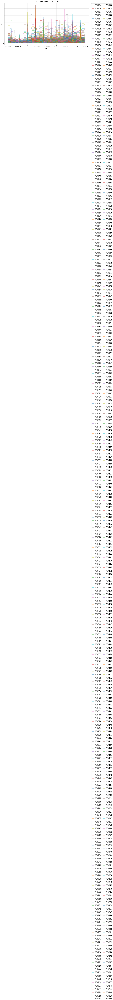

In [33]:
# All households (one line per lclid)
df = df_out_dec12.copy()
df['datetime'] = pd.to_datetime(df['datetime'])

import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(12,6))
for hid, g in df.sort_values('datetime').groupby('lclid'):
    ax.plot(g['datetime'], g['kw'], alpha=0.5, lw=0.9, label=hid)
ax.set(title="kW by household — 2012-12-12", xlabel="Time", ylabel="kW")
ax.legend(ncol=2, fontsize=8, bbox_to_anchor=(1.02,1), loc="upper left")
ax.grid(True, alpha=0.3)
plt.tight_layout(); 
plt.show()


/var/folders/pz/n2fzt2pd1dd376dvy33xfysc0000gn/T/ipykernel_32379/546887313.py:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  ax.plot(pd.to_datetime(avg_profile['tod'].astype(str)), avg_profile['kw'], marker='.')


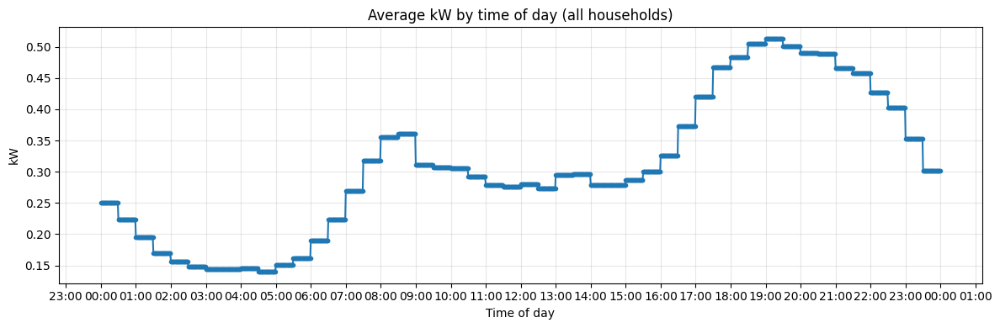

In [34]:
# Average daily profile across households
df = df_out_dec12.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df['tod'] = df['datetime'].dt.time  # time of day
avg_profile = df.groupby('tod')['kw'].mean().reset_index()

fig, ax = plt.subplots(figsize=(12,4))
ax.plot(pd.to_datetime(avg_profile['tod'].astype(str)), avg_profile['kw'], marker='.')
ax.set(title="Average kW by time of day (all households)", xlabel="Time of day", ylabel="kW")
import matplotlib.dates as mdates
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()


In [35]:
import random

# Randomly chosing 40 households to represent 40 load profiles

# 1) extracting the IDs as a list (not the whole DataFrame)
candidates = target_ids_dec12['household'].astype(str).str.strip().str.upper().unique().tolist()

# 2) sampling 40 without replacement
random.seed(42)  # reproducible
sample_ids_dec12 = random.sample(candidates, 40)

# 3) filtering the table and normalizing to match
df = df_out_dec12.copy()
df['lclid_norm'] = df['lclid'].astype(str).str.strip().str.upper()
df_lv40_ip_dec12 = df[df['lclid_norm'].isin(sample_ids_dec12)].copy()

print(len(candidates), "candidates,", df_lv40_ip_dec12['lclid_norm'].nunique(), "selected households matched.")
df_lv40_ip_dec12.head()

1396 candidates, 40 selected households matched.


,datetime,kwh_30m,kw,kwh_min,lclid,time,lclid_norm
18720,2012-12-12 00:00:00,0.103,0.206,0.003433,MAC000055,00:00:00,MAC000055
18721,2012-12-12 00:01:00,0.103,0.206,0.003433,MAC000055,00:01:00,MAC000055
18722,2012-12-12 00:02:00,0.103,0.206,0.003433,MAC000055,00:02:00,MAC000055
18723,2012-12-12 00:03:00,0.103,0.206,0.003433,MAC000055,00:03:00,MAC000055
18724,2012-12-12 00:04:00,0.103,0.206,0.003433,MAC000055,00:04:00,MAC000055


In [36]:
# Min and max energy use per house

# ensuring dtypes and sort
df = df_lv40_ip_dec12.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.sort_values(['lclid', 'datetime'])

def daily_energy_from_kw(group):
    dt_sec = group['datetime'].diff().dt.total_seconds().fillna(60)  # default 60s for first row
    # kWh = sum( kW * seconds / 3600 )
    return float((group['kw'].astype(float) * (dt_sec / 3600)).sum())

daily_kwh = df.groupby('lclid').apply(daily_energy_from_kw).rename('daily_kwh')

print(f"Max daily energy: {daily_kwh.max():.3f} kWh (house: {daily_kwh.idxmax()})")
print(f"Min daily energy: {daily_kwh.min():.3f} kWh (house: {daily_kwh.idxmin()})")


Max daily energy: 9.944 kWh (house: MAC003718)
Min daily energy: 5.052 kWh (house: MAC003046)


/var/folders/pz/n2fzt2pd1dd376dvy33xfysc0000gn/T/ipykernel_32379/1213046304.py:13: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  daily_kwh = df.groupby('lclid').apply(daily_energy_from_kw).rename('daily_kwh')


In [37]:
df_lv40_ip_dec12['lclid'].nunique()

40

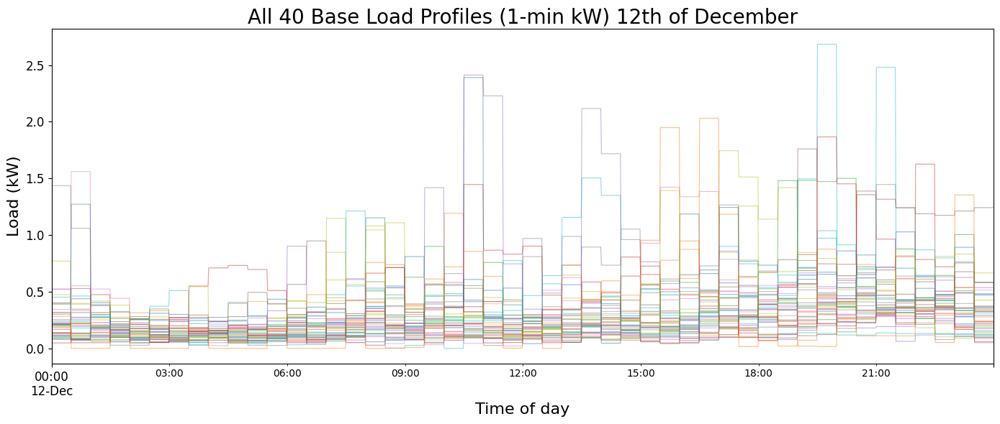

In [108]:
# Make sure datetime is datetime dtype and rows are sorted
df = df_lv40_ip_dec12.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.sort_values(['datetime', 'lclid_norm'])

# Wide table: one column per household
wide_kw = df.pivot(index='datetime', columns='lclid_norm', values='kw').sort_index()

# Plotting all profiles together (no legend to keep it readable)
ax = wide_kw.plot(figsize=(14, 6), alpha=0.5, lw=0.8, legend=False)
ax.set_ylabel("Load (kW)", fontsize=16)
ax.set_xlabel("Time of day", fontsize=16)
ax.set_title("All 40 Base Load Profiles (1-min kW) 12th of December", fontsize=20)
ax.tick_params(axis='both', labelsize=12)
plt.tight_layout()

plt.savefig('Base_load_40_dec12.png', dpi=300)

plt.show()



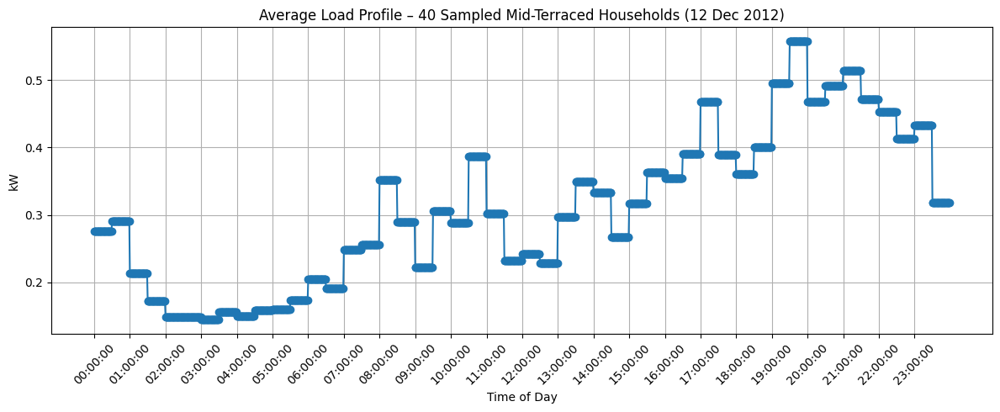

In [39]:
# Plotting average load of 40 randomly selected profiles
# Dec12
# Extracting time for grouping
df_lv40_ip_dec12['time'] = df_lv40_ip_dec12['datetime'].dt.time

# Computing average kWh per 30-min interval
avg_lv40_ip_dec12 = df_lv40_ip_dec12.groupby('time')['kw'].mean().reset_index()
avg_lv40_ip_dec12['time_str'] = avg_lv40_ip_dec12['time'].astype(str)

# Plotting
plt.figure(figsize=(12, 5))
plt.plot(avg_lv40_ip_dec12['time_str'], avg_lv40_ip_dec12['kw'], marker='o')
plt.title('Average Load Profile – 40 Sampled Mid-Terraced Households (12 Dec 2012)')
plt.xlabel('Time of Day')
plt.ylabel('kW')
plt.grid(True)

# Reducing x-axis ticks to every 12th value (i.e., every hour)
xticks_to_show = avg_lv40_ip_dec12['time_str'][::60]
plt.xticks(ticks=range(0, len(avg_lv40_ip_dec12), 60), labels=xticks_to_show, rotation=45)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [40]:
# Calculating energy consumption per household per day

df = df_lv40_ip_dec12.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df['kw'] = pd.to_numeric(df['kw'], errors='coerce')
df = df.dropna(subset=['datetime','kw']).sort_values(['lclid_norm','datetime'])

# Minutes → hours between samples (per household)
dt_h = df.groupby('lclid_norm')['datetime'].diff().dt.total_seconds().div(3600)
# fill first/zero gaps with that household’s median cadence; fallback to 1 minute
dt_h = dt_h.where(dt_h > 0, dt_h.groupby(df['lclid_norm']).transform(lambda s: s[s>0].median())).fillna(1/60)

df['e_kwh'] = df['kw'] * dt_h
df['date'] = df['datetime'].dt.date

daily_kwh_kw = (df.groupby(['lclid_norm','date'])['e_kwh']
                  .sum()
                  .reset_index(name='daily_kwh'))

# Quick check
print(daily_kwh_kw.describe())
print("Max:", daily_kwh_kw.loc[daily_kwh_kw['daily_kwh'].idxmax()])
print("Min:", daily_kwh_kw.loc[daily_kwh_kw['daily_kwh'].idxmin()])


       daily_kwh
count  40.000000
mean    7.421675
std     1.352525
min     5.052000
25%     6.432750
50%     7.380000
75%     8.594750
max     9.944000
Max: lclid_norm     MAC003718
date          2012-12-12
daily_kwh          9.944
Name: 30, dtype: object
Min: lclid_norm     MAC003046
date          2012-12-12
daily_kwh          5.052
Name: 26, dtype: object


In [41]:
daily_kwh_kw

,lclid_norm,date,daily_kwh
0,MAC000055,2012-12-12,8.759
1,MAC000203,2012-12-12,6.255
2,MAC000214,2012-12-12,8.049
3,MAC000239,2012-12-12,7.884
4,MAC000250,2012-12-12,5.606
5,MAC000676,2012-12-12,7.299
6,MAC000727,2012-12-12,7.214
7,MAC000734,2012-12-12,9.742
8,MAC000761,2012-12-12,6.912
9,MAC000792,2012-12-12,7.347


## Finding peak power to check correctness

In [42]:
# Peak power and its timing per house
df = df_lv40_ip_dec12.copy()

# Cleaning dtypes
df['datetime'] = pd.to_datetime(df['datetime'])
df['kw'] = pd.to_numeric(df['kw'], errors='coerce')
df = df.dropna(subset=['datetime','kw'])

# Choosing the ID column to use
id_col = 'lclid_norm' if 'lclid_norm' in df.columns else 'lclid'

# Index of the max kW within each house
imax = df.groupby(id_col)['kw'].idxmax()

# Pull those rows and format the output
peaks = (df.loc[imax, [id_col, 'kw', 'datetime']]
           .rename(columns={'kw':'peak_kW', 'datetime':'peak_datetime'})
           .sort_values(id_col))

# Adding time-of-day column
peaks['peak_time'] = peaks['peak_datetime'].dt.strftime('%H:%M')

peaks.head()


,lclid_norm,peak_kW,peak_datetime,peak_time
19200,MAC000055,1.152,2012-12-12 08:00:00,08:00
74400,MAC000203,0.874,2012-12-12 16:00:00,16:00
78870,MAC000214,1.480,2012-12-12 18:30:00,18:30
89160,MAC000239,1.626,2012-12-12 22:00:00,22:00
94860,MAC000250,0.718,2012-12-12 21:00:00,21:00


In [43]:
peaks

,lclid_norm,peak_kW,peak_datetime,peak_time
19200,MAC000055,1.152,2012-12-12 08:00:00,08:00
74400,MAC000203,0.874,2012-12-12 16:00:00,16:00
78870,MAC000214,1.480,2012-12-12 18:30:00,18:30
89160,MAC000239,1.626,2012-12-12 22:00:00,22:00
94860,MAC000250,0.718,2012-12-12 21:00:00,21:00
256710,MAC000676,0.948,2012-12-12 06:30:00,06:30
272190,MAC000727,1.560,2012-12-12 00:30:00,00:30
276060,MAC000734,1.266,2012-12-12 17:00:00,17:00
285600,MAC000761,1.046,2012-12-12 08:00:00,08:00
302130,MAC000792,0.972,2012-12-12 19:30:00,19:30


In [44]:
peaks_sorted = peaks.set_index('peak_kW').sort_index(ascending=False)
peaks_sorted.head(10)

,lclid_norm,peak_datetime,peak_time
peak_kW,,,
2.684,MAC003490,2012-12-12 19:30:00,19:30
2.480,MAC001906,2012-12-12 21:00:00,21:00
2.412,MAC004848,2012-12-12 10:30:00,10:30
2.390,MAC001996,2012-12-12 10:30:00,10:30
2.116,MAC002756,2012-12-12 13:30:00,13:30
2.030,MAC004146,2012-12-12 16:30:00,16:30
1.866,MAC004619,2012-12-12 19:30:00,19:30
1.760,MAC001759,2012-12-12 19:00:00,19:00
1.744,MAC001816,2012-12-12 17:00:00,17:00


In [45]:
# Finding 10 top peaks
df = df_lv40_ip_dec12.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df['kw'] = pd.to_numeric(df['kw'], errors='coerce')
df = df.dropna(subset=['datetime','kw'])

top10_events = (df.sort_values('kw', ascending=False)
                  .loc[:, ['lclid_norm','datetime','kw']]
                  .head(10)
                  .rename(columns={'kw':'peak_kW'}))

top10_events


,lclid_norm,datetime,peak_kW
1246771,MAC003490,2012-12-12 19:31:00,2.684
1246770,MAC003490,2012-12-12 19:30:00,2.684
1246774,MAC003490,2012-12-12 19:34:00,2.684
1246775,MAC003490,2012-12-12 19:35:00,2.684
1246776,MAC003490,2012-12-12 19:36:00,2.684
1246777,MAC003490,2012-12-12 19:37:00,2.684
1246778,MAC003490,2012-12-12 19:38:00,2.684
1246779,MAC003490,2012-12-12 19:39:00,2.684
1246780,MAC003490,2012-12-12 19:40:00,2.684
1246781,MAC003490,2012-12-12 19:41:00,2.684


## Detecting outliers

In [46]:

# Configuration
EXPECTED_DAILY_KWH = (2.0, 10.0)   # base-only winter day ~2–8 kWh
EXPECTED_PEAK_KW   = (0.2, 3.0)    # household peak without EV/HP
EXPECTED_LOADFACT  = (0.10, 0.55)  # mean/peak typical band
STD_MIN            = 0.02          # too flat if below this (kW)
KURT_LIMITS        = (-1.5, 12.0)  # very low=too flat; very high=spiky/outliers
SPIKE_Z            = 3.5           # spikiness z-score threshold
PEAK_WINDOWS       = [(6,10), (16,23)]  # “typical” UK morning/evening windows
ROLL_MIN           = 15            # minutes for rolling mean in spikiness


df = df_lv40_ip_dec12.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.sort_values(['lclid_norm','datetime'])
df['kw'] = pd.to_numeric(df['kw'], errors='coerce')
df = df.dropna(subset=['datetime','kw'])

# Δt in hours per row within each household (robust to gaps)
dt_h = df.groupby('lclid_norm')['datetime'].diff().dt.total_seconds().div(3600)
dt_h = dt_h.where(dt_h>0, 1/60)  # default 1 minute for first row
df['e_kwh'] = df['kw'] * dt_h
df['date'] = df['datetime'].dt.date

# per-house features (for this day)
feat = []
for hid, g in df.groupby('lclid_norm'):
    s = g['kw'].astype(float).reset_index(drop=True)
    mean_kw = s.mean()
    peak_idx = s.idxmax()
    peak_kw = s.iloc[peak_idx]
    peak_ts = g['datetime'].iloc[peak_idx]
    std_kw  = s.std(ddof=0)
    kurt    = s.kurt()  # Fisher (normal≈0)
    daily_kwh = g['e_kwh'].sum()
    lf = mean_kw/peak_kw if peak_kw>0 else np.nan
    # spikiness: residual std after 15-min rolling mean
    roll = s.rolling(ROLL_MIN, center=True, min_periods=1).mean()
    spikiness = (s - roll).std(ddof=0)
    feat.append({
        'lclid_norm': hid,
        'daily_kwh': daily_kwh,
        'mean_kW': mean_kw,
        'peak_kW': peak_kw,
        'peak_datetime': peak_ts,
        'std_kW': std_kw,
        'kurtosis': kurt,
        'load_factor': lf,
        'min_kW': s.min(),
        'peak_hour': peak_ts.hour,
    })
feat = pd.DataFrame(feat)

# cohort-wise spikiness z-score
spk = feat['kurtosis'].copy()  
spikiness_series = []
for hid, g in df.groupby('lclid_norm'):
    s = g['kw'].astype(float).reset_index(drop=True)
    roll = s.rolling(ROLL_MIN, center=True, min_periods=1).mean()
    spikiness_series.append((s - roll).std(ddof=0))
feat['spikiness'] = spikiness_series
z_spike = (feat['spikiness'] - feat['spikiness'].mean()) / (feat['spikiness'].std(ddof=0) + 1e-9)
feat['spike_z'] = z_spike

def in_windows(h, windows=PEAK_WINDOWS):
    return any(lo <= h < hi for (lo,hi) in windows)

# flag outliers with reasons
flags = []
for _, r in feat.iterrows():
    reasons = []
    if r['min_kW'] < -1e-6: reasons.append('negative power values')
    if not (EXPECTED_DAILY_KWH[0] <= r['daily_kwh'] <= EXPECTED_DAILY_KWH[1]):
        reasons.append('daily_kwh out of band')
    if not (EXPECTED_PEAK_KW[0] <= r['peak_kW'] <= EXPECTED_PEAK_KW[1]):
        reasons.append('peak_kW out of band')
    if not (EXPECTED_LOADFACT[0] <= r['load_factor'] <= EXPECTED_LOADFACT[1]):
        reasons.append('load_factor out of band')
    if r['std_kW'] < STD_MIN: reasons.append('too flat / low variability')
    if not (KURT_LIMITS[0] <= r['kurtosis'] <= KURT_LIMITS[1]):
        reasons.append('kurtosis extreme')
    if r['spike_z'] > SPIKE_Z: reasons.append('excessive spikiness')
    if not in_windows(int(r['peak_hour'])): reasons.append('peak at atypical hour')
    if reasons:
        flags.append({'lclid_norm': r['lclid_norm'], 'reasons': ', '.join(reasons)})
flags = pd.DataFrame(flags)

print("Feature summary (head)")
print(feat.head().round(4))
print("\nOutlier houses")
print(flags if len(flags) else "None")


Feature summary (head)
  lclid_norm  daily_kwh  mean_kW  peak_kW       peak_datetime  std_kW  \
0  MAC000055      8.759   0.3650    1.152 2012-12-12 08:00:00  0.1747   
1  MAC000203      6.255   0.2606    0.874 2012-12-12 16:00:00  0.1730   
2  MAC000214      8.049   0.3354    1.480 2012-12-12 18:30:00  0.2646   
3  MAC000239      7.884   0.3285    1.626 2012-12-12 22:00:00  0.2446   
4  MAC000250      5.606   0.2336    0.718 2012-12-12 21:00:00  0.1936   

   kurtosis  load_factor  min_kW  peak_hour  spikiness  spike_z  
0    7.6827       0.3168   0.194          8     0.0387  -0.5195  
1    2.5018       0.2982   0.062         16     0.0375  -0.5737  
2    5.2212       0.2266   0.054         18     0.0505   0.0174  
3   14.2304       0.2020   0.080         22     0.0646   0.6538  
4   -0.0406       0.3253   0.092         21     0.0180  -1.4508  

Outlier houses
   lclid_norm                                  reasons
0   MAC000239                         kurtosis extreme
1   MAC000727  k

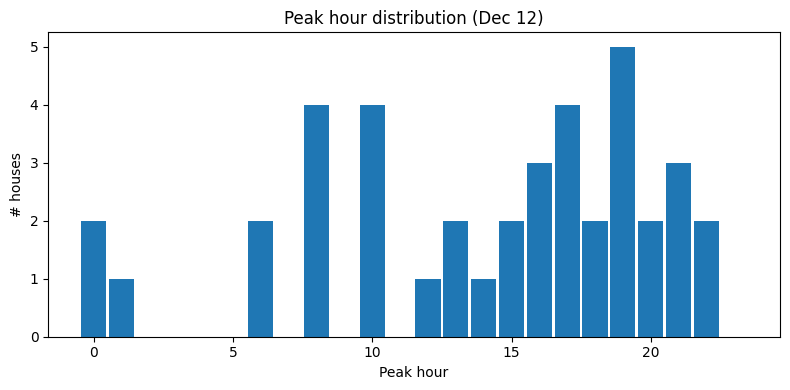


=== Outliers after relaxed rule ===
  lclid_norm                reasons  peak_hour   kurtosis
1  MAC001759       kurtosis extreme         19  24.830743
2  MAC001996       kurtosis extreme         10  20.568985
0  MAC000727  peak at atypical hour          0  12.326214
3  MAC002733  peak at atypical hour         14   0.846396
4  MAC002756  peak at atypical hour         13   8.664241
5  MAC003046  peak at atypical hour          1  -1.047686
6  MAC003473  peak at atypical hour         12   2.459700
7  MAC003718  peak at atypical hour          0   3.525859
8  MAC005531  peak at atypical hour         13   8.965810
Spike-clipped houses: ['MAC001759', 'MAC001996']


In [47]:
# 1) Visualise peak-hour distribution (to pick reasonable windows)
plt.figure(figsize=(8,4))
plt.hist(feat['peak_hour'], bins=np.arange(0,25)-0.5, rwidth=0.9)
plt.xlabel("Peak hour"); plt.ylabel("# houses"); plt.title("Peak hour distribution (Dec 12)")
plt.tight_layout(); plt.show()

# 2) Relax the "typical peak" rule
#    Option A (simple, UK winter): morning 05–11, evening 15–24 (including 23)
TYPICAL_WINDOWS = [(5, 11), (15, 24)]  # inclusive lower, exclusive upper

def in_windows(h, windows=TYPICAL_WINDOWS):
    return any(lo <= h < hi for (lo, hi) in windows)

#    Option B (data-driven): accept middle 80% of observed peak hours
h10, h90 = np.percentile(feat['peak_hour'], [10, 90])
def is_typical_data_driven(h):
    return (h10 <= h <= h90)

# Toggle which to use:
use_data_driven = False

def is_typical(h):
    return is_typical_data_driven(h) if use_data_driven else in_windows(h)

# 3) Re-flag outliers with the relaxed hour rule and a stricter kurtosis cap
EXPECTED_DAILY_KWH = (2.0, 12.0)
EXPECTED_PEAK_KW   = (0.2, 3.0)
EXPECTED_LOADFACT  = (0.10, 0.60)
STD_MIN            = 0.02
KURT_LIMITS        = (-1.5, 18.0)  # slightly looser than before
SPIKE_Z            = 3.5

flags2 = []
for _, r in feat.iterrows():
    reasons = []
    if r['min_kW'] < -1e-6: reasons.append('negative power values')
    if not (EXPECTED_DAILY_KWH[0] <= r['daily_kwh'] <= EXPECTED_DAILY_KWH[1]):
        reasons.append('daily_kwh out of band')
    if not (EXPECTED_PEAK_KW[0] <= r['peak_kW'] <= EXPECTED_PEAK_KW[1]):
        reasons.append('peak_kW out of band')
    if not (EXPECTED_LOADFACT[0] <= r['load_factor'] <= EXPECTED_LOADFACT[1]):
        reasons.append('load_factor out of band')
    if r['std_kW'] < STD_MIN: reasons.append('too flat / low variability')
    if not (KURT_LIMITS[0] <= r['kurtosis'] <= KURT_LIMITS[1]):
        reasons.append('kurtosis extreme')
    if r['spike_z'] > SPIKE_Z: reasons.append('excessive spikiness')
    if not is_typical(int(r['peak_hour'])): reasons.append('peak at atypical hour')
    if reasons:
        flags2.append({'lclid_norm': r['lclid_norm'], 'reasons': ', '.join(reasons), 'peak_hour': r['peak_hour'], 'kurtosis': r['kurtosis']})

flags2 = pd.DataFrame(flags2).sort_values(['reasons','lclid_norm'])
print("\n=== Outliers after relaxed rule ===")
print(flags2 if len(flags2) else "None")

# 4) For any remaining "kurtosis/spiky" outliers, clip spikes (gentle, preserves shape)
def clip_spikes(series, win=7, z=6.0):
    s = pd.Series(series, dtype='float64')
    med = s.rolling(win, center=True, min_periods=1).median()
    resid = s - med
    mad = resid.abs().rolling(win, center=True, min_periods=1).median().add(1e-9)
    cap = z * mad
    return (med + resid.clip(-cap, cap)).astype(float)

# Example application:
# df_dec = the original per-minute dataframe for Dec 12 (df_lv40_ip_dec12)
df_dec = df_lv40_ip_dec12.copy()
df_dec['datetime'] = pd.to_datetime(df_dec['datetime'])
df_dec = df_dec.sort_values(['lclid_norm','datetime'])

spiky_ids = set(flags2.loc[flags2['reasons'].str.contains('kurtosis|spiki', case=False, na=False), 'lclid_norm'])
df_fixed = df_dec.copy()
for hid in spiky_ids:
    mask = df_fixed['lclid_norm'] == hid
    df_fixed.loc[mask, 'kw'] = clip_spikes(df_fixed.loc[mask, 'kw'])
print(f"Spike-clipped houses: {sorted(spiky_ids)}")


  lclid_norm  peak_hour  daily_kwh  peak_kW       peak_datetime   kurtosis  \
2  MAC000727          0      7.214    1.560 2012-12-12 00:30:00  12.326214   
7  MAC003718          0      9.944    1.272 2012-12-12 00:30:00   3.525859   
5  MAC003046          1      5.052    0.524 2012-12-12 01:00:00  -1.047686   
1  MAC001996         10      7.413    2.390 2012-12-12 10:30:00  20.568985   
6  MAC003473         12      6.070    0.810 2012-12-12 12:00:00   2.459700   
4  MAC002756         13      7.491    2.116 2012-12-12 13:30:00   8.664241   
8  MAC005531         13      6.235    1.504 2012-12-12 13:30:00   8.965810   
3  MAC002733         14      6.613    0.806 2012-12-12 14:30:00   0.846396   
0  MAC001759         19      8.093    1.760 2012-12-12 19:00:00  24.830743   

   load_factor  
2     0.192682  
7     0.325734  
5     0.401718  
1     0.129236  
6     0.312243  
4     0.147507  
8     0.172734  
3     0.341863  
0     0.191596  


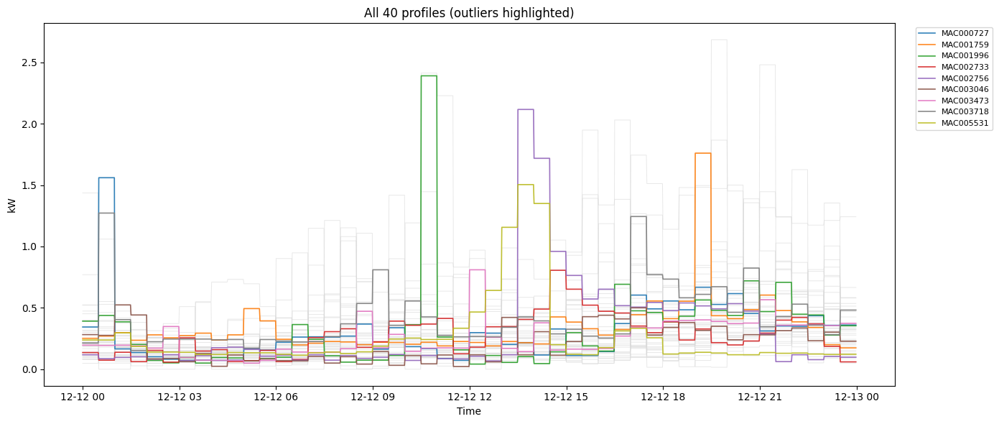

In [48]:
# Review the flagged houses (table + quick plots)
# flags2 from the last step; feat from the features table
review = (flags2[['lclid_norm','peak_hour']]
          .merge(feat[['lclid_norm','daily_kwh','peak_kW','peak_datetime','kurtosis','load_factor']],
                 on='lclid_norm'))
print(review.sort_values('peak_hour'))

# Visual check: overlay all (grey) + flagged (red)
df = df_lv40_ip_dec12.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
import matplotlib.pyplot as plt

flag_ids = flags2['lclid_norm'].tolist()
plt.figure(figsize=(14,6))
for hid, g in df.groupby('lclid_norm'):
    plt.plot(g['datetime'], g['kw'], color='0.85', lw=0.7, alpha=0.6)
for hid, g in df[df['lclid_norm'].isin(flag_ids)].groupby('lclid_norm'):
    plt.plot(g['datetime'], g['kw'], lw=1.2, alpha=0.9, label=hid)
plt.ylabel('kW'); plt.xlabel('Time'); plt.title('All 40 profiles (outliers highlighted)')
if flag_ids: plt.legend(bbox_to_anchor=(1.02,1), loc='upper left', fontsize=8)
plt.tight_layout(); plt.show()


In [49]:
# typical windows for winter weekday
TYPICAL_WINDOWS = [(5,11),(15,24)]
def in_win(h): return any(lo <= h < hi for (lo,hi) in TYPICAL_WINDOWS)
labels = feat[['lclid_norm','peak_hour']].copy()
labels['typical_peak'] = labels['peak_hour'].apply(in_win)

# two cohorts
typical_ids = labels.loc[labels['typical_peak'], 'lclid_norm'].tolist()
atypical_ids = labels.loc[~labels['typical_peak'], 'lclid_norm'].tolist()
print(f"Typical: {len(typical_ids)}, Atypical: {len(atypical_ids)}  → {sorted(atypical_ids)}")


Typical: 33, Atypical: 7  → ['MAC000727', 'MAC002733', 'MAC002756', 'MAC003046', 'MAC003473', 'MAC003718', 'MAC005531']


In [50]:
wide = (df.pivot(index='datetime', columns='lclid_norm', values='kw')
          .sort_index())

feeder_all = wide.sum(axis=1)
feeder_typ = wide[typical_ids].sum(axis=1)

def peak_stats(x):
    idx = x.idxmax()
    return float(x.max()), idx

all_pk, all_t = peak_stats(feeder_all)
typ_pk, typ_t = peak_stats(feeder_typ)

print(f"Feeder peak (all 40): {all_pk:.2f} kW at {all_t}")
print(f"Feeder peak (typical only): {typ_pk:.2f} kW at {typ_t}")
print(f"Δpeak: {all_pk-typ_pk:.2f} kW ({(all_pk-typ_pk)/all_pk*100:.1f}%)")


Feeder peak (all 40): 22.31 kW at 2012-12-12 19:30:00
Feeder peak (typical only): 19.53 kW at 2012-12-12 19:30:00
Δpeak: 2.78 kW (12.5%)


In [51]:
suspects = flags2[flags2['peak_hour'].isin([0,1])]['lclid_norm'].tolist()
for hid in suspects:
    g = df[df['lclid_norm']==hid].sort_values('datetime')
    # peak duration above 80% of house peak
    thr = 0.80 * g['kw'].max()
    dur_min = (g.loc[g['kw']>=thr, 'datetime'].diff().dt.total_seconds().fillna(0)/60).sum() + 1
    print(hid, "peak_kW=", g['kw'].max(), "dur≈", round(dur_min), "min")


MAC000727 peak_kW= 1.56 dur≈ 30 min
MAC003046 peak_kW= 0.524 dur≈ 990 min
MAC003718 peak_kW= 1.272 dur≈ 1020 min


## Extracting to CSV

In [52]:
df_lv40_ip_dec12.head()

,datetime,kwh_30m,kw,kwh_min,lclid,time,lclid_norm
18720,2012-12-12 00:00:00,0.103,0.206,0.003433,MAC000055,00:00:00,MAC000055
18721,2012-12-12 00:01:00,0.103,0.206,0.003433,MAC000055,00:01:00,MAC000055
18722,2012-12-12 00:02:00,0.103,0.206,0.003433,MAC000055,00:02:00,MAC000055
18723,2012-12-12 00:03:00,0.103,0.206,0.003433,MAC000055,00:03:00,MAC000055
18724,2012-12-12 00:04:00,0.103,0.206,0.003433,MAC000055,00:04:00,MAC000055


In [53]:
# Dec12
# Pivoting to wide format: rows = time, columns = LCLid, values = kWh
load_matrix_dec12 = df_lv40_ip_dec12.pivot_table(
    index='datetime', 
    columns='lclid', 
    values='kw'
)

# Saving to CSV
load_matrix_dec12.to_csv('outputs/lv40_interpolated_profiles_12Dec2012_new.csv')
load_matrix_dec12.head()

lclid,MAC000055,MAC000203,MAC000214,MAC000239,MAC000250,MAC000676,MAC000727,MAC000734,MAC000761,MAC000792,...,MAC003718,MAC004146,MAC004508,MAC004619,MAC004848,MAC004856,MAC004933,MAC005219,MAC005325,MAC005531
datetime,,,,,,,,,,,,,,,,,,,,,
2012-12-12 00:00:00,0.206,0.188,0.084,0.226,0.522,0.134,0.344,0.216,0.77,0.452,...,0.214,0.31,0.096,0.168,0.11,0.402,0.524,1.436,0.474,0.238
2012-12-12 00:01:00,0.206,0.188,0.084,0.226,0.522,0.134,0.344,0.216,0.77,0.452,...,0.214,0.31,0.096,0.168,0.11,0.402,0.524,1.436,0.474,0.238
2012-12-12 00:02:00,0.206,0.188,0.084,0.226,0.522,0.134,0.344,0.216,0.77,0.452,...,0.214,0.31,0.096,0.168,0.11,0.402,0.524,1.436,0.474,0.238
2012-12-12 00:03:00,0.206,0.188,0.084,0.226,0.522,0.134,0.344,0.216,0.77,0.452,...,0.214,0.31,0.096,0.168,0.11,0.402,0.524,1.436,0.474,0.238
2012-12-12 00:04:00,0.206,0.188,0.084,0.226,0.522,0.134,0.344,0.216,0.77,0.452,...,0.214,0.31,0.096,0.168,0.11,0.402,0.524,1.436,0.474,0.238


RMSE between full group and 40-sample on Dec12: 0.0458 kW
MAE  between full group and 40-sample on Dec12: 0.0343 kW


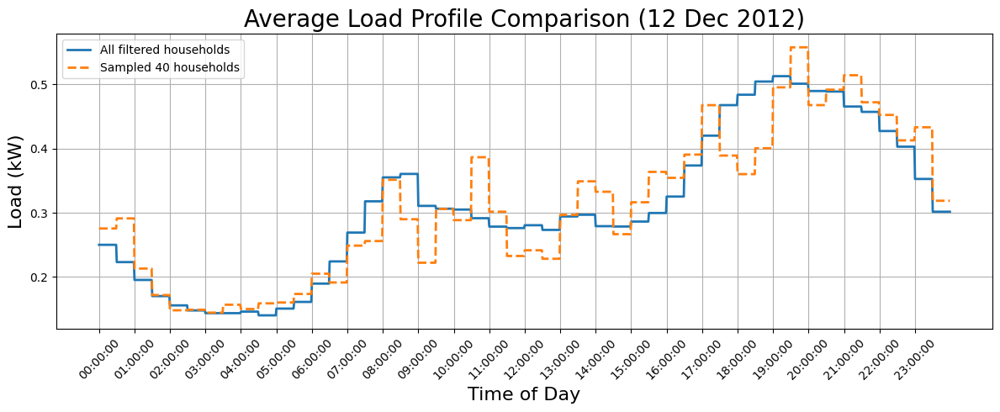

In [110]:
# Plotting filtered 1396 households vs 40 random chosen households
# Dec12

df_out_dec12['time'] = df_out_dec12['datetime'].dt.time
df_lv40_ip_dec12['time'] = df_lv40_ip_dec12['datetime'].dt.time

# Compute average profile for all filtered households
avg_all_dec12 = df_out_dec12.groupby('time')['kw'].mean().reset_index()
avg_all_dec12['time_str'] = avg_all_dec12['time'].astype(str)

# Compute average profile for the 40 sampled households
avg_40_dec12 = df_lv40_ip_dec12.groupby('time')['kw'].mean().reset_index()
avg_40_dec12['time_str'] = avg_40_dec12['time'].astype(str)

# Plot both
plt.figure(figsize=(12, 5))
plt.plot(avg_all_dec12['time_str'], avg_all_dec12['kw'], label='All filtered households', linewidth=2)
plt.plot(avg_40_dec12['time_str'], avg_40_dec12['kw'], label='Sampled 40 households', linestyle='--', linewidth=2)
plt.title('Average Load Profile Comparison (12 Dec 2012)', fontsize=20)
plt.xlabel('Time of Day', fontsize=16)
plt.ylabel('Load (kW)', fontsize=16)
plt.legend()
plt.grid(True)

# Reducing x-axis ticks
xticks_to_show = avg_40_dec12['time_str'][::60]
xticks_to_show = avg_all_dec12['time_str'][::60]
plt.xticks(ticks=range(0, len(avg_40_dec12), 60), labels=xticks_to_show, rotation=45)
plt.xticks(ticks=range(0, len(avg_all_dec12), 60), labels=xticks_to_show, rotation=45)

plt.xticks(rotation=45)
plt.tight_layout()# RMSE and MAE calculation
# Dec12

# Align on time and sort
avg_all_sorted_dec12 = avg_all_dec12.sort_values('time')
avg_40_sorted_dec12 = avg_40_dec12.sort_values('time')

# Get the kW arrays
y_true_dec12 = avg_all_sorted_dec12['kw'].values
y_pred_dec12 = avg_40_sorted_dec12['kw'].values

# RMSE
rmse_dec12 = np.sqrt(np.mean((y_true_dec12 - y_pred_dec12) ** 2))

# MAE
mae_dec12 = np.mean(np.abs(y_true_dec12 - y_pred_dec12))

print(f"RMSE between full group and 40-sample on Dec12: {rmse_dec12:.4f} kW")
print(f"MAE  between full group and 40-sample on Dec12: {mae_dec12:.4f} kW")

plt.savefig('Base_load_dec12.png', dpi=300)
plt.show()


In [55]:
# Mean load per interval calculation
# Dec12
mean_interval_kw_dec12 = avg_all_dec12['kw'].mean()
print(f"Mean load per interval (all households) on Dec12: {mean_interval_kw_dec12:.4f} kW")


Mean load per interval (all households) on Dec12: 0.3078 kW


In [56]:
# Relative RMSE calculation
# Dec12
relative_rmse_dec12 = (rmse_dec12 / mean_interval_kw_dec12) * 100
print(f"Relative RMSE of Dec12: {relative_rmse_dec12:.2f}%")


Relative RMSE of Dec12: 14.88%


In [57]:
# Average interval (30 minute) consumption
# Dec12
mean_interval_40_dec12 = avg_40_dec12['kw'].mean()
print(f"Mean load per interval (40-sample) - Dec12: {mean_interval_40_dec12:.4f} kW")


Mean load per interval (40-sample) - Dec12: 0.3092 kW


In [58]:
# Relative rmse based on this group of 40 houses
# Dec12
relative_rmse_40_dec12 = (rmse_dec12 / mean_interval_40_dec12) * 100
print(f"Relative RMSE (vs 40-sample mean) - Dec12: {relative_rmse_40_dec12:.2f}%")


Relative RMSE (vs 40-sample mean) - Dec12: 14.81%


In [59]:
from sklearn.metrics import r2_score

r2_dec12 = r2_score(y_true_dec12, y_pred_dec12)
print(f"R² between full group and 40-sample on Dec12: {r2_dec12:.4f}")


R² between full group and 40-sample on Dec12: 0.8350


## 11th of February 2012 - weekend day

In [60]:
# Filtering for only 11th of February 2012
target_week_day_feb = pd.Timestamp('2012-02-11')
df_feb11 = sm_df[sm_df['datetime'].dt.date == target_week_day_feb.date()].copy()
df_feb11.head()

,lclid,tariff_type,datetime,kwh
91857,MAC000006,Std,2012-02-11 00:00:00,0.047
91858,MAC000006,Std,2012-02-11 00:30:00,0.029
91859,MAC000006,Std,2012-02-11 01:00:00,0.014
91860,MAC000006,Std,2012-02-11 01:30:00,0.047
91861,MAC000006,Std,2012-02-11 02:00:00,0.018


In [61]:
# Number of unique households in the 11 Dec dataset
df_feb11['lclid'].nunique()

592

In [62]:
# Calculating total consumption per household on 12 Dec 2012
daily_totals_feb11 = df_feb11.groupby('lclid')['kwh'].sum().reset_index()
daily_totals_feb11.columns = ['household', 'total_kwh']
daily_totals_feb11.head()

,household,total_kwh
0,MAC000006,4.098
1,MAC000016,1.362
2,MAC000018,20.133
3,MAC000019,9.500
4,MAC000020,11.385


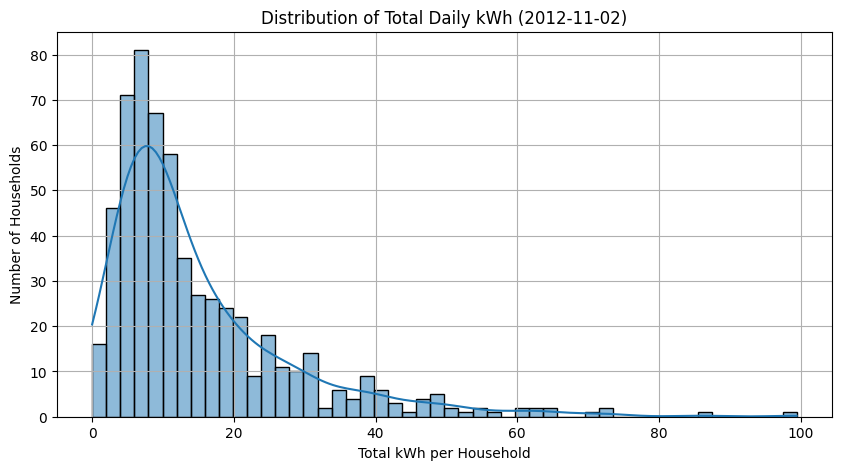

In [63]:
# Visualising distribution of consumption
plt.figure(figsize=(10, 5))
sns.histplot(daily_totals_feb11['total_kwh'], bins=50, kde=True)
plt.title('Distribution of Total Daily kWh (2012-11-02)')
plt.xlabel('Total kWh per Household')
plt.ylabel('Number of Households')
plt.grid(True)
plt.show()

In [64]:
# Filtering houses with consumption between 5 and 10 kwh a day.
# 11th of February
target_ids_feb11 = daily_totals_feb11[
    (daily_totals_feb11['total_kwh'] >= 5) & (daily_totals_feb11['total_kwh'] <= 10)
]['household']

df_feb11_5to10 = df_feb11[df_feb11['lclid'].isin(target_ids_feb11)].copy()
df_feb11_5to10.head()

,lclid,tariff_type,datetime,kwh
368846,MAC000019,Std,2012-02-11 00:00:00,0.057
368847,MAC000019,Std,2012-02-11 00:30:00,0.030
368848,MAC000019,Std,2012-02-11 01:00:00,0.044
368849,MAC000019,Std,2012-02-11 01:30:00,0.086
368850,MAC000019,Std,2012-02-11 02:00:00,0.041


In [65]:
target_ids_feb11.head()

3     MAC000019
10    MAC000026
12    MAC000028
22    MAC000039
24    MAC000041
Name: household, dtype: object

In [66]:
# Counting the number of households between 5 and 10 kwh a day.
# Feb 11
df_feb11_5to10['lclid'].nunique()

184

In [67]:
# Counting the number of households between 5 and 10 kwh a day.
# Feb 11
target_ids_feb11 = daily_totals_feb11[
    (daily_totals_feb11['total_kwh'] >= 5) & (daily_totals_feb11['total_kwh'] <= 10)
]

print("Number of households in 5–10 kWh range on feb11:", len(target_ids_feb11))


Number of households in 5–10 kWh range on feb11: 184


In [68]:
daily_totals_feb11.head()

,household,total_kwh
0,MAC000006,4.098
1,MAC000016,1.362
2,MAC000018,20.133
3,MAC000019,9.500
4,MAC000020,11.385


Filtered rows: 8790
Households matched: 184


/var/folders/pz/n2fzt2pd1dd376dvy33xfysc0000gn/T/ipykernel_32379/371002251.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.legend(bbox_to_anchor=(1.02,1), loc="upper left"); plt.tight_layout(); plt.show()


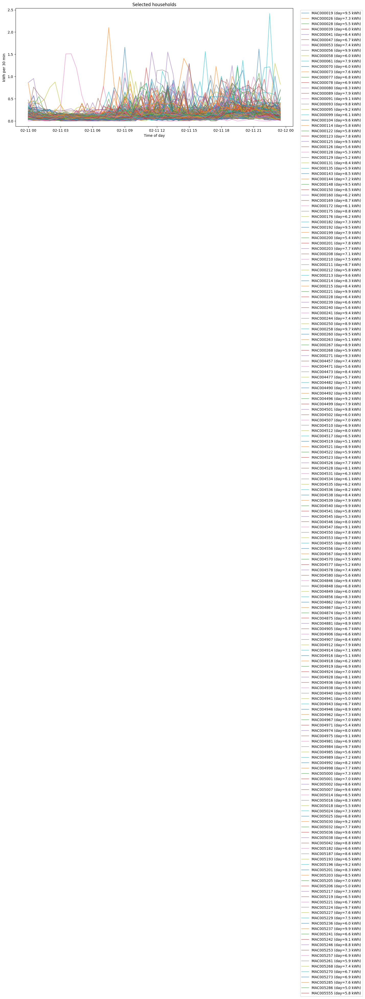

In [69]:
# 1) Normalize both tables
df_feb11 = df_feb11.copy()
df_feb11['lclid_norm'] = df_feb11['lclid'].astype(str).str.strip().str.upper()

targets = target_ids_feb11.copy()
targets['lclid_norm'] = targets['household'].astype(str).str.strip().str.upper()

# 2) Inner join to keep only selected households
df_filtered_feb11 = df_feb11.merge(
    targets[['lclid_norm', 'total_kwh']],
    on='lclid_norm',
    how='inner'
)

print("Filtered rows:", len(df_filtered_feb11))
print("Households matched:", df_filtered_feb11['lclid_norm'].nunique())

# Plot with daily total in legend
import matplotlib.pyplot as plt
plt.figure(figsize=(14,6))
for hid, g in df_filtered_feb11.groupby('lclid_norm'):
    tot = g['total_kwh'].iloc[0]
    plt.plot(pd.to_datetime(g['datetime']), g['kwh'], label=f"{hid} (day={tot:.1f} kWh)", alpha=0.6)
plt.xlabel("Time of day"); plt.ylabel("kWh per 30 min"); plt.title("Selected households")
plt.legend(bbox_to_anchor=(1.02,1), loc="upper left"); plt.tight_layout(); plt.show()


# Changing time resolution from 30 min to 1 min

In [70]:
# Converting from kwh per 30 min to kw
# 11Feb
df_filtered_feb11['kw'] = df_filtered_feb11['kwh'] * 2
df_filtered_feb11.head()

,lclid,tariff_type,datetime,kwh,lclid_norm,total_kwh,kw
0,MAC000019,Std,2012-02-11 00:00:00,0.057,MAC000019,9.5,0.114
1,MAC000019,Std,2012-02-11 00:30:00,0.030,MAC000019,9.5,0.060
2,MAC000019,Std,2012-02-11 01:00:00,0.044,MAC000019,9.5,0.088
3,MAC000019,Std,2012-02-11 01:30:00,0.086,MAC000019,9.5,0.172
4,MAC000019,Std,2012-02-11 02:00:00,0.041,MAC000019,9.5,0.082


In [71]:
df_filtered_feb11.tail()

,lclid,tariff_type,datetime,kwh,lclid_norm,total_kwh,kw
8785,MAC005555,Std,2012-02-11 21:30:00,0.103,MAC005555,5.795,0.206
8786,MAC005555,Std,2012-02-11 22:00:00,0.134,MAC005555,5.795,0.268
8787,MAC005555,Std,2012-02-11 22:30:00,0.134,MAC005555,5.795,0.268
8788,MAC005555,Std,2012-02-11 23:00:00,0.136,MAC005555,5.795,0.272
8789,MAC005555,Std,2012-02-11 23:30:00,0.105,MAC005555,5.795,0.210


In [72]:
df_filtered_feb11['kwh'].sum()

1375.0469999

In [73]:
# Interpolating 30-minutes resolution to 1-minutes resolution of power
# Feb11

# Cleaning column names
df_filtered_feb11.columns = df_filtered_feb11.columns.str.strip().str.lower()

# Ensuring datetime column is present and parsed
if df_filtered_feb11.index.name == 'datetime':
    df_filtered_feb11.reset_index(inplace=True)

df_filtered_feb11['datetime'] = pd.to_datetime(df_filtered_feb11['datetime'], errors='coerce')
df_filtered_feb11 = df_filtered_feb11.dropna(subset=['datetime'])

# Ensuring numeric conversion and calculating average power (kW)
df_filtered_feb11['kwh'] = pd.to_numeric(df_filtered_feb11['kwh'], errors='coerce')
df_filtered_feb11['kw'] = df_filtered_feb11['kwh'] * 2  # since 30 minutes = 0.5h

# Defining per-household processing function

def process_household(lclid, df_house_feb11):
    # clean & sort
    s = (df_house_feb11
         .set_index('datetime')
         .sort_index())
    s = s[~s.index.duplicated(keep='first')]

    # 30-min energy and average power (kW)
    s['kwh_30m'] = pd.to_numeric(s['kwh'], errors='coerce')
    s['kw'] = s['kwh_30m'] * 2.0  # kWh / 0.5 h

    pieces = []
    # do it day-by-day so we always end at 23:59
    for day, g in s.groupby(pd.Grouper(freq='D')):
        if g.empty:
            continue
        day_start = day.normalize()
        day_end   = day_start + pd.Timedelta(days=1) - pd.Timedelta(minutes=1)
        full_idx  = pd.date_range(day_start, day_end, freq='1min')

        # reindex to full day and fill inside the day
        # (fill to hold the 30-min block constant)
        out = (g[['kwh_30m','kw']]
               .reindex(full_idx)
               .ffill()
               .bfill())

        out['kwh_min'] = out['kw'] / 60.0
        out['lclid'] = lclid
        out['time'] = out.index.time
        pieces.append(out)

    out = pd.concat(pieces).sort_index()
    out.index.name = "datetime"
    return out




# Applying to all households
df_out_feb11 = (
    df_filtered_feb11
    .groupby('lclid', group_keys=False)
    .apply(lambda df_group_feb11: process_household(df_group_feb11['lclid'].iloc[0], df_group_feb11))
)

# Finalizing output
df_out_feb11.reset_index(inplace=True)  # restore datetime as a column

# Saving to CSV
#df_out_feb11.to_csv("resampled_all_households_5min.csv", index=False)

df_out_feb11.head(30)

/var/folders/pz/n2fzt2pd1dd376dvy33xfysc0000gn/T/ipykernel_32379/2118496175.py:63: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df_group_feb11: process_household(df_group_feb11['lclid'].iloc[0], df_group_feb11))


,datetime,kwh_30m,kw,kwh_min,lclid,time
0,2012-02-11 00:00:00,0.057,0.114,0.0019,MAC000019,00:00:00
1,2012-02-11 00:01:00,0.057,0.114,0.0019,MAC000019,00:01:00
2,2012-02-11 00:02:00,0.057,0.114,0.0019,MAC000019,00:02:00
3,2012-02-11 00:03:00,0.057,0.114,0.0019,MAC000019,00:03:00
4,2012-02-11 00:04:00,0.057,0.114,0.0019,MAC000019,00:04:00
5,2012-02-11 00:05:00,0.057,0.114,0.0019,MAC000019,00:05:00
6,2012-02-11 00:06:00,0.057,0.114,0.0019,MAC000019,00:06:00
7,2012-02-11 00:07:00,0.057,0.114,0.0019,MAC000019,00:07:00
8,2012-02-11 00:08:00,0.057,0.114,0.0019,MAC000019,00:08:00
9,2012-02-11 00:09:00,0.057,0.114,0.0019,MAC000019,00:09:00


In [74]:
df_out_feb11.tail(5)

,datetime,kwh_30m,kw,kwh_min,lclid,time
264955,2012-02-11 23:55:00,0.105,0.21,0.0035,MAC005555,23:55:00
264956,2012-02-11 23:56:00,0.105,0.21,0.0035,MAC005555,23:56:00
264957,2012-02-11 23:57:00,0.105,0.21,0.0035,MAC005555,23:57:00
264958,2012-02-11 23:58:00,0.105,0.21,0.0035,MAC005555,23:58:00
264959,2012-02-11 23:59:00,0.105,0.21,0.0035,MAC005555,23:59:00


In [75]:
g = df_out_feb11[df_out_feb11['lclid']=='MAC000019'].set_index('datetime')
# Step behaviour (no ramps within 30-min blocks)
print("Max minute-to-minute change within 30 min:",
      g['kw'].groupby(pd.Grouper(freq='30min')).apply(lambda s: s.diff().abs().max()).max())
# Daily energy preserved
kwh_30_sum = df_filtered_feb11[df_filtered_feb11['lclid']=='MAC000019'].groupby(pd.Grouper(key='datetime', freq='D'))['kwh'].sum()
kwh_1min_sum = (g['kw']/60).groupby(pd.Grouper(freq='D')).sum()
print(pd.concat([kwh_30_sum.rename('kWh_30m'), kwh_1min_sum.rename('kWh_1m')], axis=1))


Max minute-to-minute change within 30 min: 0.0
            kWh_30m  kWh_1m
datetime                   
2012-02-11      9.5     9.5


In [76]:
df_out_feb11['kwh_min'].sum()

1388.4329999000001

In [77]:
df_out_feb11['lclid'].nunique()

184

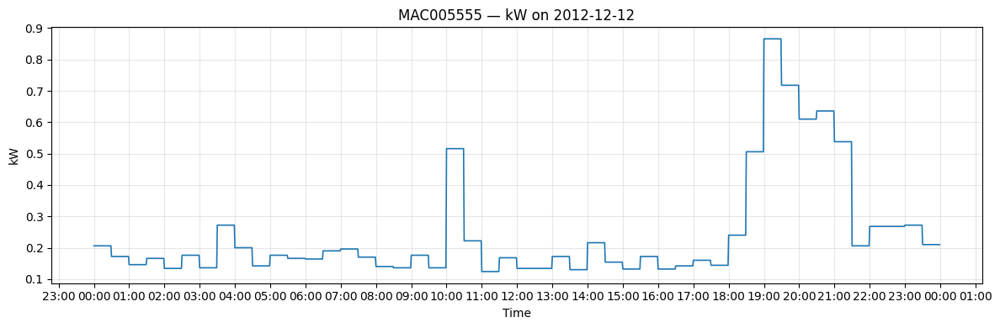

In [78]:
# Plot kW for one household
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

df = df_out_feb11.copy()
df['datetime'] = pd.to_datetime(df['datetime'])

hid = "MAC005555"  # house number
g = df[df['lclid'] == hid].sort_values('datetime')

fig, ax = plt.subplots(figsize=(12,4))
ax.plot(g['datetime'], g['kw'], lw=1.2)
ax.set(title=f"{hid} — kW on 2012-12-12", xlabel="Time", ylabel="kW")
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()



/var/folders/pz/n2fzt2pd1dd376dvy33xfysc0000gn/T/ipykernel_32379/3799038794.py:12: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


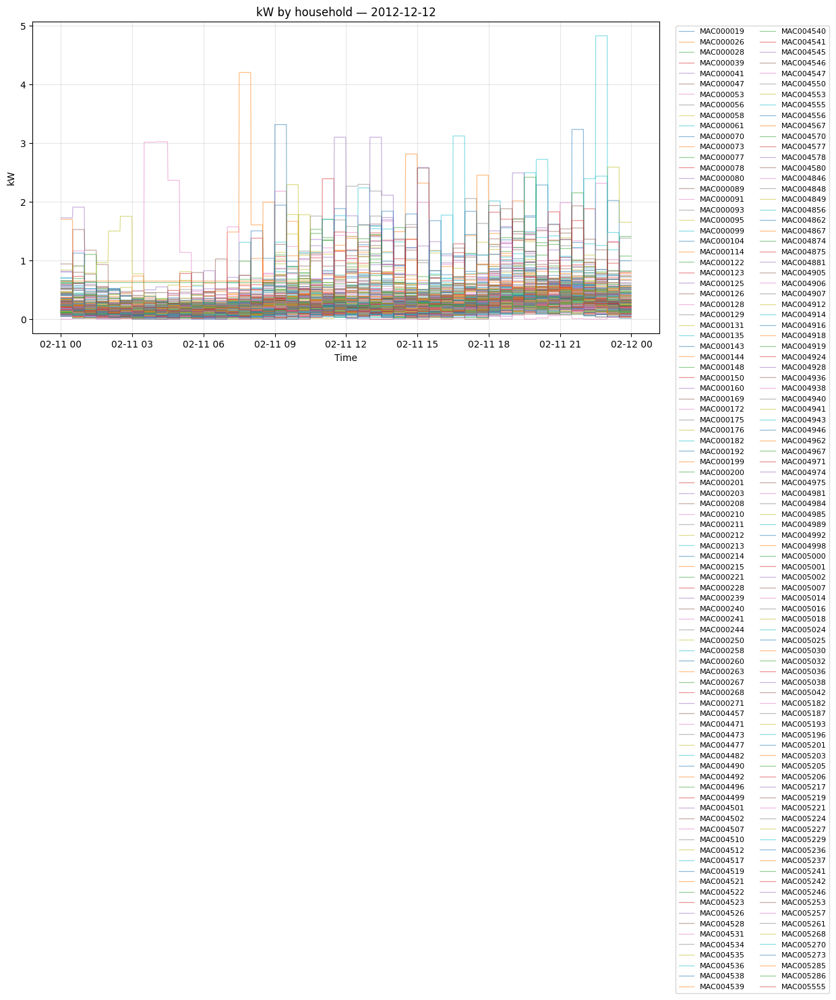

In [79]:
# Overlay all households (one line per lclid)
df = df_out_feb11.copy()
df['datetime'] = pd.to_datetime(df['datetime'])

import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(12,6))
for hid, g in df.sort_values('datetime').groupby('lclid'):
    ax.plot(g['datetime'], g['kw'], alpha=0.5, lw=0.9, label=hid)
ax.set(title="kW by household — 2012-12-12", xlabel="Time", ylabel="kW")
ax.legend(ncol=2, fontsize=8, bbox_to_anchor=(1.02,1), loc="upper left")
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


/var/folders/pz/n2fzt2pd1dd376dvy33xfysc0000gn/T/ipykernel_32379/4127171808.py:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  ax.plot(pd.to_datetime(avg_profile['tod'].astype(str)), avg_profile['kw'], marker='.')


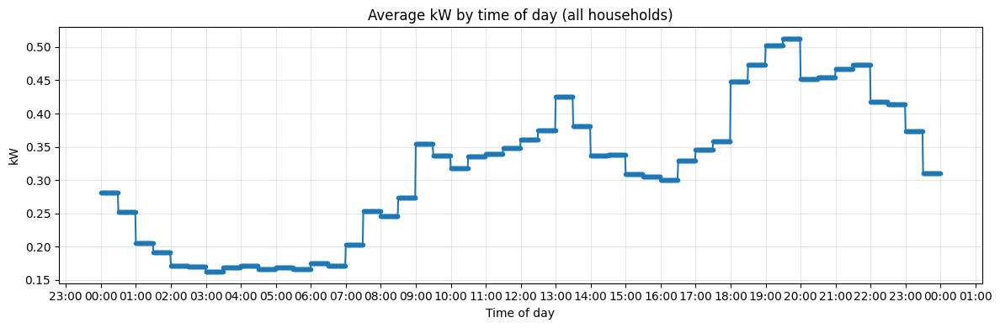

In [80]:
# Average daily profile across households (time-of-day mean)
df = df_out_feb11.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df['tod'] = df['datetime'].dt.time  # time of day
avg_profile = df.groupby('tod')['kw'].mean().reset_index()

fig, ax = plt.subplots(figsize=(12,4))
ax.plot(pd.to_datetime(avg_profile['tod'].astype(str)), avg_profile['kw'], marker='.')
ax.set(title="Average kW by time of day (all households)", xlabel="Time of day", ylabel="kW")
import matplotlib.dates as mdates
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [81]:
import random

# Randomly chosing 40 households to represent 40 load profiles

# 1) extract the IDs as a list (not the whole DataFrame)
candidates = target_ids_feb11['household'].astype(str).str.strip().str.upper().unique().tolist()

# 2) sample 40 without replacement
random.seed(41)  # reproducible
sample_ids_feb11 = random.sample(candidates, 40)

# 3) filter the table (normalize to match)
df = df_out_feb11.copy()
df['lclid_norm'] = df['lclid'].astype(str).str.strip().str.upper()
df_lv40_ip_feb11 = df[df['lclid_norm'].isin(sample_ids_feb11)].copy()

print(len(candidates), "candidates,", df_lv40_ip_feb11['lclid_norm'].nunique(), "selected households matched.")
df_lv40_ip_feb11.head()

184 candidates, 40 selected households matched.


,datetime,kwh_30m,kw,kwh_min,lclid,time,lclid_norm
2880,2012-02-11 00:00:00,0.075,0.15,0.0025,MAC000028,00:00:00,MAC000028
2881,2012-02-11 00:01:00,0.075,0.15,0.0025,MAC000028,00:01:00,MAC000028
2882,2012-02-11 00:02:00,0.075,0.15,0.0025,MAC000028,00:02:00,MAC000028
2883,2012-02-11 00:03:00,0.075,0.15,0.0025,MAC000028,00:03:00,MAC000028
2884,2012-02-11 00:04:00,0.075,0.15,0.0025,MAC000028,00:04:00,MAC000028


In [82]:
# Min and max energy use per house

# ensure dtypes and sort
df = df_lv40_ip_feb11.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.sort_values(['lclid', 'datetime'])

def daily_energy_from_kw(group):
    dt_sec = group['datetime'].diff().dt.total_seconds().fillna(60)  # default 60s for first row
    # kWh = sum( kW * seconds / 3600 )
    return float((group['kw'].astype(float) * (dt_sec / 3600)).sum())

daily_kwh = df.groupby('lclid').apply(daily_energy_from_kw).rename('daily_kwh')

print(f"Max daily energy: {daily_kwh.max():.3f} kWh (house: {daily_kwh.idxmax()})")
print(f"Min daily energy: {daily_kwh.min():.3f} kWh (house: {daily_kwh.idxmin()})")


Max daily energy: 9.946 kWh (house: MAC004540)
Min daily energy: 5.422 kWh (house: MAC000200)


/var/folders/pz/n2fzt2pd1dd376dvy33xfysc0000gn/T/ipykernel_32379/3289608105.py:13: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  daily_kwh = df.groupby('lclid').apply(daily_energy_from_kw).rename('daily_kwh')


In [83]:
df_lv40_ip_feb11['lclid'].nunique()

40

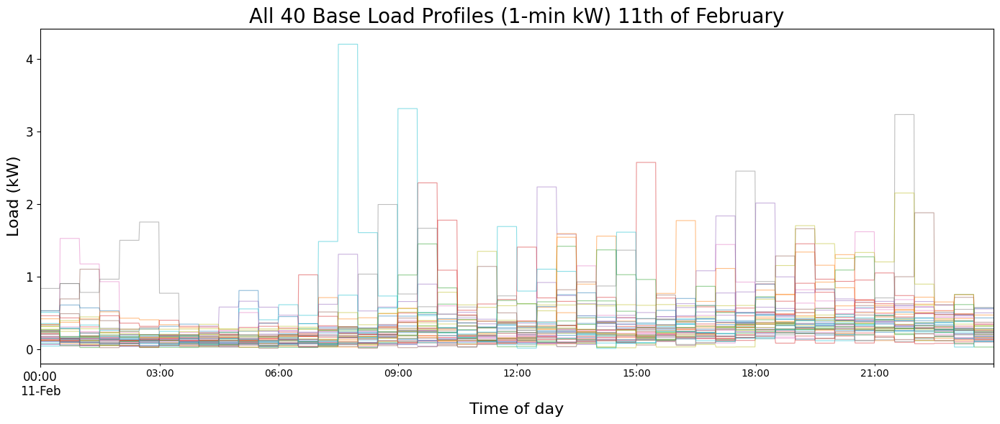

In [109]:
# Make sure datetime is datetime dtype and rows are sorted
df = df_lv40_ip_feb11.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.sort_values(['datetime', 'lclid_norm'])

# Wide table: one column per household
wide_kw = df.pivot(index='datetime', columns='lclid_norm', values='kw').sort_index()

# Plot all profiles together (no legend to keep it readable)
ax = wide_kw.plot(figsize=(14, 6), alpha=0.5, lw=0.8, legend=False)
ax.set_ylabel("Load (kW)", fontsize=16)
ax.set_xlabel("Time of day", fontsize=16)
ax.set_title("All 40 Base Load Profiles (1-min kW) 11th of February", fontsize=20)
ax.tick_params(axis='both', labelsize=12)
plt.tight_layout()

plt.savefig('Base_load_40_feb11.png', dpi=300)

plt.show()

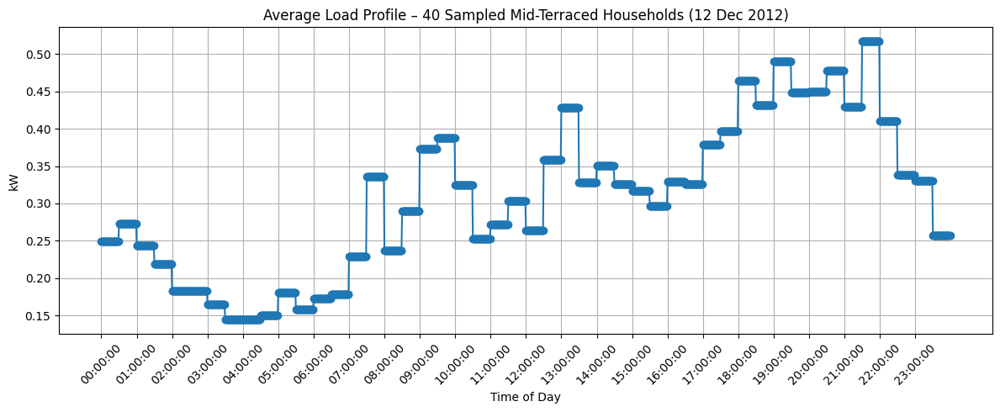

In [85]:
# Plotting average load of 40 randomly selected profiles
# Feb11
# Extracting time for grouping
df_lv40_ip_feb11['time'] = df_lv40_ip_feb11['datetime'].dt.time

# Computing average kWh per 30-min interval
avg_lv40_ip_feb11 = df_lv40_ip_feb11.groupby('time')['kw'].mean().reset_index()
avg_lv40_ip_feb11['time_str'] = avg_lv40_ip_feb11['time'].astype(str)

# Plotting
plt.figure(figsize=(12, 5))
plt.plot(avg_lv40_ip_feb11['time_str'], avg_lv40_ip_feb11['kw'], marker='o')
plt.title('Average Load Profile – 40 Sampled Mid-Terraced Households (12 Dec 2012)')
plt.xlabel('Time of Day')
plt.ylabel('kW')
plt.grid(True)

# Reducing x-axis ticks to every 12th value (i.e., every hour)
xticks_to_show = avg_lv40_ip_feb11['time_str'][::60]
plt.xticks(ticks=range(0, len(avg_lv40_ip_feb11), 60), labels=xticks_to_show, rotation=45)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [86]:
# calculate energy consumption per household per day


df = df_lv40_ip_feb11.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df['kw'] = pd.to_numeric(df['kw'], errors='coerce')
df = df.dropna(subset=['datetime','kw']).sort_values(['lclid_norm','datetime'])

# minutes → hours between samples (per household)
dt_h = df.groupby('lclid_norm')['datetime'].diff().dt.total_seconds().div(3600)
# fill first/zero gaps with that household’s median cadence; fallback to 1 minute
dt_h = dt_h.where(dt_h > 0, dt_h.groupby(df['lclid_norm']).transform(lambda s: s[s>0].median())).fillna(1/60)

df['e_kwh'] = df['kw'] * dt_h
df['date'] = df['datetime'].dt.date

daily_kwh_kw = (df.groupby(['lclid_norm','date'])['e_kwh']
                  .sum()
                  .reset_index(name='daily_kwh'))

# quick check
print(daily_kwh_kw.describe())
print("Max:", daily_kwh_kw.loc[daily_kwh_kw['daily_kwh'].idxmax()])
print("Min:", daily_kwh_kw.loc[daily_kwh_kw['daily_kwh'].idxmin()])


       daily_kwh
count  40.000000
mean    7.395975
std     1.258284
min     5.422000
25%     6.456000
50%     7.320500
75%     8.110750
max     9.946000
Max: lclid_norm     MAC004540
date          2012-02-11
daily_kwh          9.946
Name: 21, dtype: object
Min: lclid_norm     MAC000200
date          2012-02-11
daily_kwh          5.422
Name: 12, dtype: object


In [87]:
daily_kwh_kw

,lclid_norm,date,daily_kwh
0,MAC000028,2012-02-11,5.474
1,MAC000041,2012-02-11,8.410
2,MAC000058,2012-02-11,6.016
3,MAC000089,2012-02-11,7.864
4,MAC000095,2012-02-11,9.222
5,MAC000126,2012-02-11,5.572
6,MAC000143,2012-02-11,8.451
7,MAC000144,2012-02-11,7.248
8,MAC000148,2012-02-11,9.452
9,MAC000172,2012-02-11,6.074


## Finding peak power to check correctness

In [88]:
# Peak power and its timing per house
df = df_lv40_ip_feb11.copy()

# Clean dtypes
df['datetime'] = pd.to_datetime(df['datetime'])
df['kw'] = pd.to_numeric(df['kw'], errors='coerce')
df = df.dropna(subset=['datetime','kw'])

# Choose the ID column
id_col = 'lclid_norm' if 'lclid_norm' in df.columns else 'lclid'

# Index of the max kW within each house
imax = df.groupby(id_col)['kw'].idxmax()

# Pull those rows and format the output
peaks = (df.loc[imax, [id_col, 'kw', 'datetime']]
           .rename(columns={'kw':'peak_kW', 'datetime':'peak_datetime'})
           .sort_values(id_col))

# Adding time-of-day column
peaks['peak_time'] = peaks['peak_datetime'].dt.strftime('%H:%M')

peaks.head()


,lclid_norm,peak_kW,peak_datetime,peak_time
3900,MAC000028,0.542,2012-02-11 17:00:00,17:00
6900,MAC000041,1.340,2012-02-11 19:00:00,19:00
12090,MAC000058,1.452,2012-02-11 09:30:00,09:30
22740,MAC000089,1.454,2012-02-11 19:00:00,19:00
26670,MAC000095,0.920,2012-02-11 12:30:00,12:30


In [89]:
peaks

,lclid_norm,peak_kW,peak_datetime,peak_time
3900,MAC000028,0.542,2012-02-11 17:00:00,17:00
6900,MAC000041,1.340,2012-02-11 19:00:00,19:00
12090,MAC000058,1.452,2012-02-11 09:30:00,09:30
22740,MAC000089,1.454,2012-02-11 19:00:00,19:00
26670,MAC000095,0.920,2012-02-11 12:30:00,12:30
37140,MAC000126,1.662,2012-02-11 19:00:00,19:00
44430,MAC000143,1.620,2012-02-11 20:30:00,20:30
45690,MAC000144,2.456,2012-02-11 17:30:00,17:30
46680,MAC000148,0.786,2012-02-11 10:00:00,10:00
52410,MAC000172,0.508,2012-02-11 09:30:00,09:30


In [90]:
peaks_sorted = peaks.set_index('peak_kW').sort_index(ascending=False)
peaks_sorted.head(10)

,lclid_norm,peak_datetime,peak_time
peak_kW,,,
4.206,MAC004521,2012-02-11 07:30:00,07:30
3.318,MAC005273,2012-02-11 09:00:00,09:00
3.236,MAC004490,2012-02-11 21:30:00,21:30
2.576,MAC000240,2012-02-11 15:00:00,15:00
2.456,MAC000144,2012-02-11 17:30:00,17:30
2.294,MAC004553,2012-02-11 09:30:00,09:30
2.238,MAC000258,2012-02-11 12:30:00,12:30
2.154,MAC004496,2012-02-11 21:30:00,21:30
2.016,MAC005229,2012-02-11 18:00:00,18:00


In [91]:
# Finding 10 top peaks
df = df_lv40_ip_feb11.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df['kw'] = pd.to_numeric(df['kw'], errors='coerce')
df = df.dropna(subset=['datetime','kw'])

top10_events = (df.sort_values('kw', ascending=False)
                  .loc[:, ['lclid_norm','datetime','kw']]
                  .head(10)
                  .rename(columns={'kw':'peak_kW'}))

top10_events


,lclid_norm,datetime,peak_kW
117098,MAC004521,2012-02-11 07:38:00,4.206
117093,MAC004521,2012-02-11 07:33:00,4.206
117091,MAC004521,2012-02-11 07:31:00,4.206
117090,MAC004521,2012-02-11 07:30:00,4.206
117094,MAC004521,2012-02-11 07:34:00,4.206
117095,MAC004521,2012-02-11 07:35:00,4.206
117096,MAC004521,2012-02-11 07:36:00,4.206
117097,MAC004521,2012-02-11 07:37:00,4.206
117099,MAC004521,2012-02-11 07:39:00,4.206
117100,MAC004521,2012-02-11 07:40:00,4.206


## Detecting outliers

In [92]:

# Configuration
EXPECTED_DAILY_KWH = (2.0, 10.0)   # base-only winter day ~2–8 kWh
EXPECTED_PEAK_KW   = (0.2, 3.0)    # household peak without EV/HP
EXPECTED_LOADFACT  = (0.10, 0.55)  # mean/peak typical band
STD_MIN            = 0.02          # too flat if below this (kW)
KURT_LIMITS        = (-1.5, 12.0)  # very low=too flat; very high=spiky/outliers
SPIKE_Z            = 3.5           # spikiness z-score threshold
PEAK_WINDOWS       = [(6,10), (16,23)]  # “typical” UK morning/evening windows
ROLL_MIN           = 15            # minutes for rolling mean in spikiness

df = df_lv40_ip_feb11.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.sort_values(['lclid_norm','datetime'])
df['kw'] = pd.to_numeric(df['kw'], errors='coerce')
df = df.dropna(subset=['datetime','kw'])

# Δt in hours per row within each household (robust to gaps)
dt_h = df.groupby('lclid_norm')['datetime'].diff().dt.total_seconds().div(3600)
dt_h = dt_h.where(dt_h>0, 1/60)  # default 1 minute for first row
df['e_kwh'] = df['kw'] * dt_h
df['date'] = df['datetime'].dt.date

# per-house features (for this day)
feat = []
for hid, g in df.groupby('lclid_norm'):
    s = g['kw'].astype(float).reset_index(drop=True)
    mean_kw = s.mean()
    peak_idx = s.idxmax()
    peak_kw = s.iloc[peak_idx]
    peak_ts = g['datetime'].iloc[peak_idx]
    std_kw  = s.std(ddof=0)
    kurt    = s.kurt()  # Fisher (normal≈0)
    daily_kwh = g['e_kwh'].sum()
    lf = mean_kw/peak_kw if peak_kw>0 else np.nan
    # spikiness: residual std after 15-min rolling mean
    roll = s.rolling(ROLL_MIN, center=True, min_periods=1).mean()
    spikiness = (s - roll).std(ddof=0)
    feat.append({
        'lclid_norm': hid,
        'daily_kwh': daily_kwh,
        'mean_kW': mean_kw,
        'peak_kW': peak_kw,
        'peak_datetime': peak_ts,
        'std_kW': std_kw,
        'kurtosis': kurt,
        'load_factor': lf,
        'min_kW': s.min(),
        'peak_hour': peak_ts.hour,
    })
feat = pd.DataFrame(feat)

# cohort-wise spikiness z-score
spk = feat['kurtosis'].copy()  
spikiness_series = []
for hid, g in df.groupby('lclid_norm'):
    s = g['kw'].astype(float).reset_index(drop=True)
    roll = s.rolling(ROLL_MIN, center=True, min_periods=1).mean()
    spikiness_series.append((s - roll).std(ddof=0))
feat['spikiness'] = spikiness_series
z_spike = (feat['spikiness'] - feat['spikiness'].mean()) / (feat['spikiness'].std(ddof=0) + 1e-9)
feat['spike_z'] = z_spike

def in_windows(h, windows=PEAK_WINDOWS):
    return any(lo <= h < hi for (lo,hi) in windows)

# flag outliers with reasons
flags = []
for _, r in feat.iterrows():
    reasons = []
    if r['min_kW'] < -1e-6: reasons.append('negative power values')
    if not (EXPECTED_DAILY_KWH[0] <= r['daily_kwh'] <= EXPECTED_DAILY_KWH[1]):
        reasons.append('daily_kwh out of band')
    if not (EXPECTED_PEAK_KW[0] <= r['peak_kW'] <= EXPECTED_PEAK_KW[1]):
        reasons.append('peak_kW out of band')
    if not (EXPECTED_LOADFACT[0] <= r['load_factor'] <= EXPECTED_LOADFACT[1]):
        reasons.append('load_factor out of band')
    if r['std_kW'] < STD_MIN: reasons.append('too flat / low variability')
    if not (KURT_LIMITS[0] <= r['kurtosis'] <= KURT_LIMITS[1]):
        reasons.append('kurtosis extreme')
    if r['spike_z'] > SPIKE_Z: reasons.append('excessive spikiness')
    if not in_windows(int(r['peak_hour'])): reasons.append('peak at atypical hour')
    if reasons:
        flags.append({'lclid_norm': r['lclid_norm'], 'reasons': ', '.join(reasons)})
flags = pd.DataFrame(flags)

print("=== Feature summary (head) ===")
print(feat.head().round(4))
print("\n=== Outlier houses ===")
print(flags if len(flags) else "None")


=== Feature summary (head) ===
  lclid_norm  daily_kwh  mean_kW  peak_kW       peak_datetime  std_kW  \
0  MAC000028      5.474   0.2281    0.542 2012-02-11 17:00:00  0.1124   
1  MAC000041      8.410   0.3504    1.340 2012-02-11 19:00:00  0.2851   
2  MAC000058      6.016   0.2507    1.452 2012-02-11 09:30:00  0.3076   
3  MAC000089      7.864   0.3277    1.454 2012-02-11 19:00:00  0.3343   
4  MAC000095      9.222   0.3843    0.920 2012-02-11 12:30:00  0.2172   

   kurtosis  load_factor  min_kW  peak_hour  spikiness  spike_z  
0   -0.0691       0.4208   0.108         17     0.0161  -1.3935  
1    2.1211       0.2615   0.046         19     0.0388  -0.6009  
2    7.4490       0.1726   0.030          9     0.0594   0.1164  
3    1.3432       0.2254   0.068         19     0.0430  -0.4576  
4   -1.0559       0.4177   0.094         12     0.0314  -0.8596  

=== Outlier houses ===
   lclid_norm                                            reasons
0   MAC000095                              pe

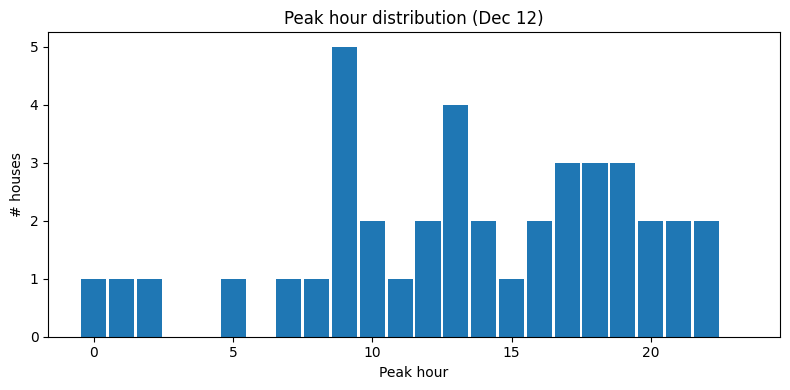


=== Outliers after relaxed rule ===
   lclid_norm                                            reasons  peak_hour  \
1   MAC000172                                   kurtosis extreme          9   
2   MAC000240          load_factor out of band, kurtosis extreme         15   
0   MAC000095                              peak at atypical hour         12   
3   MAC000258                              peak at atypical hour         12   
4   MAC004457                              peak at atypical hour          0   
7   MAC004528                              peak at atypical hour         13   
8   MAC004540                              peak at atypical hour         14   
9   MAC004550                              peak at atypical hour         14   
10  MAC004874                              peak at atypical hour          1   
11  MAC004918                              peak at atypical hour         13   
12  MAC005016                              peak at atypical hour         11   
13  MAC005024  

In [93]:

# 1) Visualise peak-hour distribution (to pick reasonable windows)
plt.figure(figsize=(8,4))
plt.hist(feat['peak_hour'], bins=np.arange(0,25)-0.5, rwidth=0.9)
plt.xlabel("Peak hour"); plt.ylabel("# houses"); plt.title("Peak hour distribution (Dec 12)")
plt.tight_layout(); plt.show()

# 2) Relax the "typical peak" rule
#    Option A (simple, UK winter): morning 05–11, evening 15–24 (include 23)
TYPICAL_WINDOWS = [(5, 11), (15, 24)]  # inclusive lower, exclusive upper

def in_windows(h, windows=TYPICAL_WINDOWS):
    return any(lo <= h < hi for (lo, hi) in windows)

#    Option B (data-driven): accept middle 80% of observed peak hours
h10, h90 = np.percentile(feat['peak_hour'], [10, 90])
def is_typical_data_driven(h):
    return (h10 <= h <= h90)

# Toggle which you want to use:
use_data_driven = False

def is_typical(h):
    return is_typical_data_driven(h) if use_data_driven else in_windows(h)

# 3) Re-flag outliers with the relaxed hour rule and a stricter kurtosis cap
EXPECTED_DAILY_KWH = (2.0, 12.0)
EXPECTED_PEAK_KW   = (0.2, 3.0)
EXPECTED_LOADFACT  = (0.10, 0.60)
STD_MIN            = 0.02
KURT_LIMITS        = (-1.5, 18.0)  # slightly looser than before
SPIKE_Z            = 3.5

flags2 = []
for _, r in feat.iterrows():
    reasons = []
    if r['min_kW'] < -1e-6: reasons.append('negative power values')
    if not (EXPECTED_DAILY_KWH[0] <= r['daily_kwh'] <= EXPECTED_DAILY_KWH[1]):
        reasons.append('daily_kwh out of band')
    if not (EXPECTED_PEAK_KW[0] <= r['peak_kW'] <= EXPECTED_PEAK_KW[1]):
        reasons.append('peak_kW out of band')
    if not (EXPECTED_LOADFACT[0] <= r['load_factor'] <= EXPECTED_LOADFACT[1]):
        reasons.append('load_factor out of band')
    if r['std_kW'] < STD_MIN: reasons.append('too flat / low variability')
    if not (KURT_LIMITS[0] <= r['kurtosis'] <= KURT_LIMITS[1]):
        reasons.append('kurtosis extreme')
    if r['spike_z'] > SPIKE_Z: reasons.append('excessive spikiness')
    if not is_typical(int(r['peak_hour'])): reasons.append('peak at atypical hour')
    if reasons:
        flags2.append({'lclid_norm': r['lclid_norm'], 'reasons': ', '.join(reasons), 'peak_hour': r['peak_hour'], 'kurtosis': r['kurtosis']})

flags2 = pd.DataFrame(flags2).sort_values(['reasons','lclid_norm'])
print("\n=== Outliers after relaxed rule ===")
print(flags2 if len(flags2) else "None")

# 4) For any remaining "kurtosis/spiky" outliers, clip spikes (gentle, preserves shape)
def clip_spikes(series, win=7, z=6.0):
    s = pd.Series(series, dtype='float64')
    med = s.rolling(win, center=True, min_periods=1).median()
    resid = s - med
    mad = resid.abs().rolling(win, center=True, min_periods=1).median().add(1e-9)
    cap = z * mad
    return (med + resid.clip(-cap, cap)).astype(float)

# Example application:
# df_dec = the original per-minute dataframe for Dec 12 (df_lv40_ip_dec12)
df_dec = df_lv40_ip_dec12.copy()
df_dec['datetime'] = pd.to_datetime(df_dec['datetime'])
df_dec = df_dec.sort_values(['lclid_norm','datetime'])

spiky_ids = set(flags2.loc[flags2['reasons'].str.contains('kurtosis|spiki', case=False, na=False), 'lclid_norm'])
df_fixed = df_dec.copy()
for hid in spiky_ids:
    mask = df_fixed['lclid_norm'] == hid
    df_fixed.loc[mask, 'kw'] = clip_spikes(df_fixed.loc[mask, 'kw'])
print(f"Spike-clipped houses: {sorted(spiky_ids)}")


   lclid_norm  peak_hour  daily_kwh  peak_kW       peak_datetime   kurtosis  \
4   MAC004457          0      7.379    1.528 2012-02-11 00:30:00   6.185080   
8   MAC004874          1      7.478    1.104 2012-02-11 01:00:00  13.348347   
13  MAC005268          2      7.365    1.754 2012-02-11 02:30:00   6.233369   
15  MAC004521          7      8.857    4.206 2012-02-11 07:30:00  25.451306   
0   MAC000172          9      6.074    0.508 2012-02-11 09:30:00  -1.576055   
16  MAC005273          9      6.875    3.318 2012-02-11 09:00:00  35.646512   
10  MAC005016         11      8.272    1.692 2012-02-11 11:30:00   5.248625   
2   MAC000095         12      9.222    0.920 2012-02-11 12:30:00  -1.055877   
3   MAC000258         12      9.741    2.238 2012-02-11 12:30:00   8.293351   
5   MAC004528         13      8.057    0.778 2012-02-11 13:30:00   2.929224   
9   MAC004918         13      6.174    1.150 2012-02-11 13:30:00   4.618663   
11  MAC005024         13      7.264    0.752 2012-02

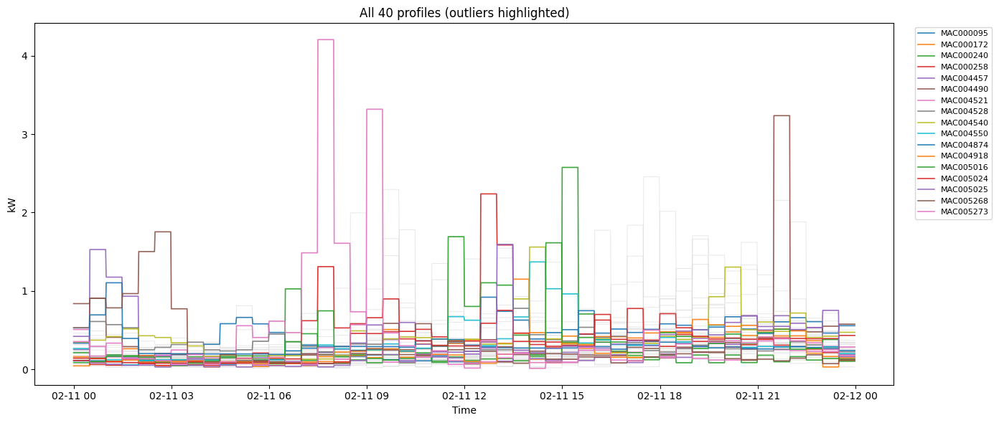

In [94]:
# Review the flagged houses (table + quick plots)
# flags2 from the last step; feat from the features table
review = (flags2[['lclid_norm','peak_hour']]
          .merge(feat[['lclid_norm','daily_kwh','peak_kW','peak_datetime','kurtosis','load_factor']],
                 on='lclid_norm'))
print(review.sort_values('peak_hour'))

# Visual check: overlay all (grey) + flagged (red)
df = df_lv40_ip_feb11.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
import matplotlib.pyplot as plt

flag_ids = flags2['lclid_norm'].tolist()
plt.figure(figsize=(14,6))
for hid, g in df.groupby('lclid_norm'):
    plt.plot(g['datetime'], g['kw'], color='0.85', lw=0.7, alpha=0.6)
for hid, g in df[df['lclid_norm'].isin(flag_ids)].groupby('lclid_norm'):
    plt.plot(g['datetime'], g['kw'], lw=1.2, alpha=0.9, label=hid)
plt.ylabel('kW'); plt.xlabel('Time'); plt.title('All 40 profiles (outliers highlighted)')
if flag_ids: plt.legend(bbox_to_anchor=(1.02,1), loc='upper left', fontsize=8)
plt.tight_layout(); plt.show()


In [95]:
# typical windows for winter weekday
TYPICAL_WINDOWS = [(5,11),(15,24)]
def in_win(h): return any(lo <= h < hi for (lo,hi) in TYPICAL_WINDOWS)
labels = feat[['lclid_norm','peak_hour']].copy()
labels['typical_peak'] = labels['peak_hour'].apply(in_win)

# two cohorts
typical_ids = labels.loc[labels['typical_peak'], 'lclid_norm'].tolist()
atypical_ids = labels.loc[~labels['typical_peak'], 'lclid_norm'].tolist()
print(f"Typical: {len(typical_ids)}, Atypical: {len(atypical_ids)}  → {sorted(atypical_ids)}")


Typical: 28, Atypical: 12  → ['MAC000095', 'MAC000258', 'MAC004457', 'MAC004528', 'MAC004540', 'MAC004550', 'MAC004874', 'MAC004918', 'MAC005016', 'MAC005024', 'MAC005025', 'MAC005268']


In [96]:
wide = (df.pivot(index='datetime', columns='lclid_norm', values='kw')
          .sort_index())

feeder_all = wide.sum(axis=1)
feeder_typ = wide[typical_ids].sum(axis=1)

def peak_stats(x):
    idx = x.idxmax()
    return float(x.max()), idx

all_pk, all_t = peak_stats(feeder_all)
typ_pk, typ_t = peak_stats(feeder_typ)

print(f"Feeder peak (all 40): {all_pk:.2f} kW at {all_t}")
print(f"Feeder peak (typical only): {typ_pk:.2f} kW at {typ_t}")
print(f"Δpeak: {all_pk-typ_pk:.2f} kW ({(all_pk-typ_pk)/all_pk*100:.1f}%)")


Feeder peak (all 40): 20.70 kW at 2012-02-11 21:30:00
Feeder peak (typical only): 15.71 kW at 2012-02-11 21:30:00
Δpeak: 4.99 kW (24.1%)


In [97]:
suspects = flags2[flags2['peak_hour'].isin([0,1])]['lclid_norm'].tolist()
for hid in suspects:
    g = df[df['lclid_norm']==hid].sort_values('datetime')
    # peak duration above 80% of house peak
    thr = 0.80 * g['kw'].max()
    dur_min = (g.loc[g['kw']>=thr, 'datetime'].diff().dt.total_seconds().fillna(0)/60).sum() + 1
    print(hid, "peak_kW=", g['kw'].max(), "dur≈", round(dur_min), "min")


MAC004457 peak_kW= 1.528 dur≈ 30 min
MAC004874 peak_kW= 1.104 dur≈ 30 min


## Extracting to CSV

In [98]:
df_lv40_ip_feb11.head()

,datetime,kwh_30m,kw,kwh_min,lclid,time,lclid_norm
2880,2012-02-11 00:00:00,0.075,0.15,0.0025,MAC000028,00:00:00,MAC000028
2881,2012-02-11 00:01:00,0.075,0.15,0.0025,MAC000028,00:01:00,MAC000028
2882,2012-02-11 00:02:00,0.075,0.15,0.0025,MAC000028,00:02:00,MAC000028
2883,2012-02-11 00:03:00,0.075,0.15,0.0025,MAC000028,00:03:00,MAC000028
2884,2012-02-11 00:04:00,0.075,0.15,0.0025,MAC000028,00:04:00,MAC000028


In [99]:
# Feb11
# Pivoting to wide format: rows = time, columns = LCLid, values = kWh
load_matrix_feb11 = df_lv40_ip_feb11.pivot_table(
    index='datetime', 
    columns='lclid', 
    values='kw'
)

# Saving to CSV
load_matrix_feb11.to_csv('outputs/lv40_interpolated_profiles_11Feb2012_new.csv')
load_matrix_feb11.head()

lclid,MAC000028,MAC000041,MAC000058,MAC000089,MAC000095,MAC000126,MAC000143,MAC000144,MAC000148,MAC000172,...,MAC005024,MAC005025,MAC005193,MAC005227,MAC005229,MAC005257,MAC005261,MAC005268,MAC005270,MAC005273
datetime,,,,,,,,,,,,,,,,,,,,,
2012-02-11 00:00:00,0.15,0.124,0.15,0.116,0.108,0.246,0.176,0.07,0.276,0.044,...,0.112,0.42,0.264,0.132,0.066,0.174,0.256,0.838,0.238,0.354
2012-02-11 00:01:00,0.15,0.124,0.15,0.116,0.108,0.246,0.176,0.07,0.276,0.044,...,0.112,0.42,0.264,0.132,0.066,0.174,0.256,0.838,0.238,0.354
2012-02-11 00:02:00,0.15,0.124,0.15,0.116,0.108,0.246,0.176,0.07,0.276,0.044,...,0.112,0.42,0.264,0.132,0.066,0.174,0.256,0.838,0.238,0.354
2012-02-11 00:03:00,0.15,0.124,0.15,0.116,0.108,0.246,0.176,0.07,0.276,0.044,...,0.112,0.42,0.264,0.132,0.066,0.174,0.256,0.838,0.238,0.354
2012-02-11 00:04:00,0.15,0.124,0.15,0.116,0.108,0.246,0.176,0.07,0.276,0.044,...,0.112,0.42,0.264,0.132,0.066,0.174,0.256,0.838,0.238,0.354


RMSE between full group and 40-sample on feb11: 0.0374 kW
MAE  between full group and 40-sample on feb11: 0.0288 kW


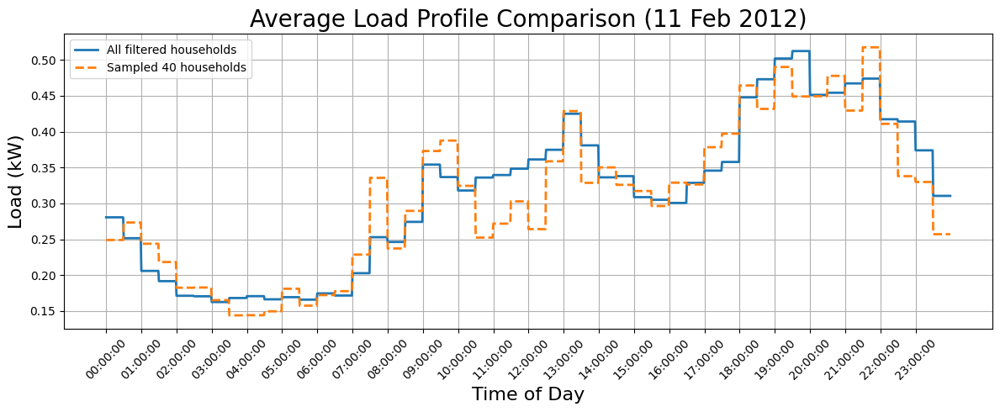

In [111]:
# Plotting filtered 1396 households vs 40 random chosen households
# Feb11

# Prepare time column
df_out_feb11['time'] = df_out_feb11['datetime'].dt.time
df_lv40_ip_feb11['time'] = df_lv40_ip_feb11['datetime'].dt.time

# Compute average profile for all filtered households
avg_all_feb11 = df_out_feb11.groupby('time')['kw'].mean().reset_index()
avg_all_feb11['time_str'] = avg_all_feb11['time'].astype(str)

# Compute average profile for the 40 sampled households
avg_40_feb11 = df_lv40_ip_feb11.groupby('time')['kw'].mean().reset_index()
avg_40_feb11['time_str'] = avg_40_feb11['time'].astype(str)

# Plot both
plt.figure(figsize=(12, 5))
plt.plot(avg_all_feb11['time_str'], avg_all_feb11['kw'], label='All filtered households', linewidth=2)
plt.plot(avg_40_feb11['time_str'], avg_40_feb11['kw'], label='Sampled 40 households', linestyle='--', linewidth=2)
plt.title('Average Load Profile Comparison (11 Feb 2012)', fontsize=20)
plt.xlabel('Time of Day', fontsize=16)
plt.ylabel('Load (kW)', fontsize=16)
plt.legend()
plt.grid(True)

# Reducing x-axis ticks
xticks_to_show = avg_40_feb11['time_str'][::60]
xticks_to_show = avg_all_feb11['time_str'][::60]
plt.xticks(ticks=range(0, len(avg_40_feb11), 60), labels=xticks_to_show, rotation=45)
plt.xticks(ticks=range(0, len(avg_all_feb11), 60), labels=xticks_to_show, rotation=45)

plt.xticks(rotation=45)
plt.tight_layout()# RMSE and MAE calculation
# feb11

# Align on time and sort
avg_all_sorted_feb11 = avg_all_feb11.sort_values('time')
avg_40_sorted_feb11 = avg_40_feb11.sort_values('time')

# Get the kW arrays
y_true_feb11 = avg_all_sorted_feb11['kw'].values
y_pred_feb11 = avg_40_sorted_feb11['kw'].values

# RMSE
rmse_feb11 = np.sqrt(np.mean((y_true_feb11 - y_pred_feb11) ** 2))

# MAE
mae_feb11 = np.mean(np.abs(y_true_feb11 - y_pred_feb11))

print(f"RMSE between full group and 40-sample on feb11: {rmse_feb11:.4f} kW")
print(f"MAE  between full group and 40-sample on feb11: {mae_feb11:.4f} kW")

plt.savefig('Base_load_feb11.png', dpi=300)
plt.show()


In [101]:
# Mean load per interval calculation
# Feb11
mean_interval_kw_feb11 = avg_all_feb11['kw'].mean()
print(f"Mean load per interval (all households) on Feb11: {mean_interval_kw_feb11:.4f} kW")


Mean load per interval (all households) on Feb11: 0.3144 kW


In [102]:
# Relative RMSE calculation
# Feb11
relative_rmse_feb11 = (rmse_feb11 / mean_interval_kw_feb11) * 100
print(f"Relative RMSE of feb11: {relative_rmse_feb11:.2f}%")


Relative RMSE of feb11: 11.90%


In [103]:
# Average interval (30 minute) consumption
# feb11
mean_interval_40_feb11 = avg_40_feb11['kw'].mean()
print(f"Mean load per interval (40-sample) - Feb11: {mean_interval_40_feb11:.4f} kW")


Mean load per interval (40-sample) - Feb11: 0.3082 kW


In [104]:
# Relative rmse based on this group of 40 houses
# Feb11
relative_rmse_40_feb11 = (rmse_feb11 / mean_interval_40_feb11) * 100
print(f"Relative RMSE (vs 40-sample mean) - Feb11: {relative_rmse_40_feb11:.2f}%")


Relative RMSE (vs 40-sample mean) - Feb11: 12.14%


In [105]:
from sklearn.metrics import r2_score

r2_feb11 = r2_score(y_true_feb11, y_pred_feb11)
print(f"R² between full group and 40-sample on Feb11: {r2_feb11:.4f}")


R² between full group and 40-sample on Feb11: 0.8721


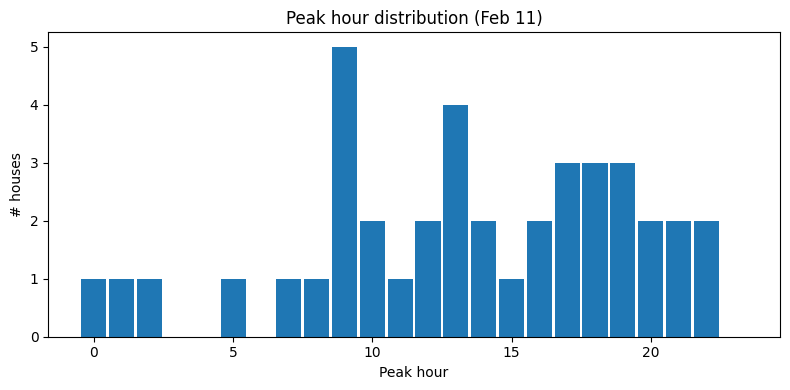


=== Outliers after relaxed rule ===
   lclid_norm                                            reasons  peak_hour  \
1   MAC000172                                   kurtosis extreme          9   
2   MAC000240          load_factor out of band, kurtosis extreme         15   
0   MAC000095                              peak at atypical hour         12   
3   MAC000258                              peak at atypical hour         12   
4   MAC004457                              peak at atypical hour          0   
7   MAC004528                              peak at atypical hour         13   
8   MAC004540                              peak at atypical hour         14   
9   MAC004550                              peak at atypical hour         14   
10  MAC004874                              peak at atypical hour          1   
11  MAC004918                              peak at atypical hour         13   
12  MAC005016                              peak at atypical hour         11   
13  MAC005024  

In [106]:

# 1) Visualise peak-hour distribution (to pick reasonable windows)
plt.figure(figsize=(8,4))
plt.hist(feat['peak_hour'], bins=np.arange(0,25)-0.5, rwidth=0.9)
plt.xlabel("Peak hour"); plt.ylabel("# houses"); plt.title("Peak hour distribution (Feb 11)")
plt.tight_layout(); plt.show()

# 2) Relax the "typical peak" rule
#    Option A (simple, UK winter): morning 05–11, evening 15–24 (include 23)
TYPICAL_WINDOWS = [(5, 11), (15, 24)]  # inclusive lower, exclusive upper

def in_windows(h, windows=TYPICAL_WINDOWS):
    return any(lo <= h < hi for (lo, hi) in windows)

#    Option B (data-driven): accept middle 80% of observed peak hours
h10, h90 = np.percentile(feat['peak_hour'], [10, 90])
def is_typical_data_driven(h):
    return (h10 <= h <= h90)

# Toggle which you want to use:
use_data_driven = False

def is_typical(h):
    return is_typical_data_driven(h) if use_data_driven else in_windows(h)

# 3) Re-flag outliers with the relaxed hour rule and a stricter kurtosis cap
EXPECTED_DAILY_KWH = (2.0, 12.0)
EXPECTED_PEAK_KW   = (0.2, 3.0)
EXPECTED_LOADFACT  = (0.10, 0.60)
STD_MIN            = 0.02
KURT_LIMITS        = (-1.5, 18.0)  # slightly looser than before
SPIKE_Z            = 3.5

flags2 = []
for _, r in feat.iterrows():
    reasons = []
    if r['min_kW'] < -1e-6: reasons.append('negative power values')
    if not (EXPECTED_DAILY_KWH[0] <= r['daily_kwh'] <= EXPECTED_DAILY_KWH[1]):
        reasons.append('daily_kwh out of band')
    if not (EXPECTED_PEAK_KW[0] <= r['peak_kW'] <= EXPECTED_PEAK_KW[1]):
        reasons.append('peak_kW out of band')
    if not (EXPECTED_LOADFACT[0] <= r['load_factor'] <= EXPECTED_LOADFACT[1]):
        reasons.append('load_factor out of band')
    if r['std_kW'] < STD_MIN: reasons.append('too flat / low variability')
    if not (KURT_LIMITS[0] <= r['kurtosis'] <= KURT_LIMITS[1]):
        reasons.append('kurtosis extreme')
    if r['spike_z'] > SPIKE_Z: reasons.append('excessive spikiness')
    if not is_typical(int(r['peak_hour'])): reasons.append('peak at atypical hour')
    if reasons:
        flags2.append({'lclid_norm': r['lclid_norm'], 'reasons': ', '.join(reasons), 'peak_hour': r['peak_hour'], 'kurtosis': r['kurtosis']})

flags2 = pd.DataFrame(flags2).sort_values(['reasons','lclid_norm'])
print("\n=== Outliers after relaxed rule ===")
print(flags2 if len(flags2) else "None")

# 4) For any remaining "kurtosis/spiky" outliers, clip spikes (gentle, preserves shape)
def clip_spikes(series, win=7, z=6.0):
    s = pd.Series(series, dtype='float64')
    med = s.rolling(win, center=True, min_periods=1).median()
    resid = s - med
    mad = resid.abs().rolling(win, center=True, min_periods=1).median().add(1e-9)
    cap = z * mad
    return (med + resid.clip(-cap, cap)).astype(float)

# Example application:
# df_dec = the original per-minute dataframe for Dec 12 (df_lv40_ip_dec12)
df_dec = df_lv40_ip_feb11.copy()
df_dec['datetime'] = pd.to_datetime(df_dec['datetime'])
df_dec = df_dec.sort_values(['lclid_norm','datetime'])

spiky_ids = set(flags2.loc[flags2['reasons'].str.contains('kurtosis|spiki', case=False, na=False), 'lclid_norm'])
df_fixed = df_dec.copy()
for hid in spiky_ids:
    mask = df_fixed['lclid_norm'] == hid
    df_fixed.loc[mask, 'kw'] = clip_spikes(df_fixed.loc[mask, 'kw'])
print(f"Spike-clipped houses: {sorted(spiky_ids)}")
